In [2]:
# importing libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Data Overview

In [3]:
file_path = 'C:/Users/PRATHAM/Downloads/Convolve 2.0 Epoch 2 PS/Dev_data_to_be_shared.xlsx'
df = pd.read_excel(file_path)
df.head()

,Primary key,Target,account_opening_date,country_code,demog_1,demog_2,income,demog_3,city_tier,occupation,...,demog_39,email_domain,demog_40,demog_41,others_42,others_43,others_44,others_45,demog_42,demog_43
0,1,0,2023-02-18,IN,53.0,3,100001 to 5L,101.0,Rural,Self_Employed,...,1,gmail,low,1,NaN,0.0,NaN,NaN,1,medium
1,2,0,2023-02-01,IN,55.0,1,0 to 1L,101.0,Tier 1,Salaried,...,1,gmail,High,1,NaN,NaN,NaN,NaN,1,High
2,3,0,2022-12-09,IN,55.0,3,0 to 1L,101.0,Tier 2,Self_Employed,...,1,gmail,medium,1,NaN,NaN,NaN,NaN,1,High
3,4,0,2023-03-31,IN,53.0,3,100001 to 5L,101.0,Tier 7,Self_Employed,...,1,gmail,High,1,NaN,NaN,NaN,NaN,1,High
4,5,0,2023-01-17,IN,55.0,6,0 to 1L,101.0,Tier 1,Student,...,1,gmail,low,1,NaN,NaN,NaN,NaN,1,medium


In [4]:
df.shape

(100000, 178)

In [5]:
pd.set_option('display.max_rows', None)  # To display all rows

In [6]:
print(df.isnull().sum())   # To count the number of missing values in each column/feature

Primary key                 0
Target                      0
account_opening_date        0
country_code             3666
demog_1                  3669
demog_2                  3668
income                      6
demog_3                     6
city_tier                4250
occupation                  2
demog_4                  8841
demog_5                    25
demog_6                     1
demog_7                     6
demog_8                  3751
demog_9                 12914
demog_10                    4
demog_11                    1
demog_12                    1
demog_13                 3016
demog_14                 3016
demog_15                 3016
demog_16                 3016
demog_17                    1
demog_18                    1
demog_19                    1
demog_20                    1
demog_21                    1
demog_22                    1
os                      24604
txn_1                   25794
txn_2                   25794
txn_3                   25794
txn_4     

In [7]:
df.describe()

,Primary key,Target,demog_1,demog_3,demog_5,demog_6,demog_7,demog_8,demog_9,demog_11,...,others_41,txn_80,txn_81,demog_39,demog_41,others_42,others_43,others_44,others_45,demog_42
count,100000.000000,100000.000000,96331.000000,99994.000000,99975.000000,99999.000000,99994.0,96249.000000,87086.000000,99999.000000,...,99999.000000,42522.000000,48535.000000,100000.000000,100000.00000,2105.000000,4579.000000,874.000000,694.000000,100000.000000
mean,50000.500000,0.020000,79.543376,101.323279,3.290163,1.017180,1.0,41.191701,0.326103,0.002250,...,0.002220,34.742439,22.679159,0.999940,0.96329,87.887886,62.024896,28.808924,96.700288,0.958470
std,28867.657797,0.140001,89.498781,5.350011,0.833449,0.182553,0.0,0.641951,0.468788,0.047381,...,0.047065,251.845838,49.903348,0.007746,0.18805,298.951251,200.384998,136.963658,370.396893,0.199514
min,1.000000,0.000000,51.000000,101.000000,1.000000,1.000000,1.0,41.000000,0.000000,0.000000,...,0.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,25000.750000,0.000000,55.000000,101.000000,3.000000,1.000000,1.0,41.000000,0.000000,0.000000,...,0.000000,2.000000,6.000000,1.000000,1.00000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,50000.500000,0.000000,55.000000,101.000000,4.000000,1.000000,1.0,41.000000,0.000000,0.000000,...,0.000000,5.000000,12.000000,1.000000,1.00000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,75000.250000,0.000000,55.000000,101.000000,4.000000,1.000000,1.0,41.000000,1.000000,0.000000,...,0.000000,15.000000,27.000000,1.000000,1.00000,2.000000,4.000000,0.000000,0.000000,1.000000
max,100000.000000,1.000000,421.000000,213.000000,4.000000,4.000000,1.0,52.000000,1.000000,1.000000,...,1.000000,13907.000000,7810.000000,1.000000,1.00000,4049.000000,3283.000000,2922.000000,3603.000000,1.000000


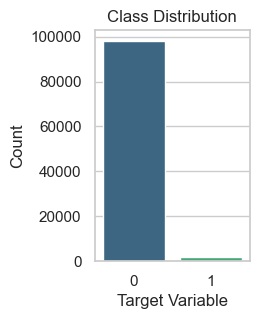

In [81]:
sns.set(style="whitegrid")
plt.figure(figsize=(2, 3))
sns.countplot(x='Target', data=df, palette='viridis')
plt.title('Class Distribution')
plt.xlabel('Target Variable')
plt.ylabel('Count')
plt.show()

In [9]:
columns = []   # Storing all column names here
for i in df.columns:
    columns.append(i)

In [10]:
for column_name in columns:
    if not len(df[column_name].value_counts()) > 20:
        print(column_name,df[column_name].value_counts())

Target 0    98000
1     2000
Name: Target, dtype: int64
demog_1 55.0     66012
53.0     16230
401.0     6858
56.0      5260
51.0       864
52.0       859
54.0       157
405.0       48
421.0       18
57.0        14
252.0        5
123.0        2
124.0        1
84.0         1
227.0        1
58.0         1
Name: demog_1, dtype: int64
demog_2 1     42008
3     16695
2     13467
6     10394
7      5493
4      5424
5      1064
10     1058
11      482
17      225
15       10
9         7
ZZ        3
16        2
Name: demog_2, dtype: int64
income 100001 to 5L          48612
0 to 1L               32783
5L to 10L              9201
0                      3816
10L to 25L             3687
25L to 50L             1162
50L to 3Crore           686
3Crore to 5Crore         37
5Crore to 10Crore         6
20Crore to 35Crore        2
10Crore to 15Crore        1
15Crore to 20Crore        1
Name: income, dtype: int64
demog_3 101.0    96434
103.0     2215
102.0      593
104.0      512
213.0      225
168.0      

In [11]:
categorical_columns = df.select_dtypes(exclude=['number']).columns

# Display the list of columns with categorical variables
print("Categorical Columns:", categorical_columns)

Categorical Columns: Index(['account_opening_date', 'country_code', 'demog_2', 'income',
       'city_tier', 'occupation', 'demog_4', 'demog_10', 'demog_22', 'os',
       'email_domain', 'demog_40', 'demog_43'],
      dtype='object')


In [12]:
numeric_columns = df.select_dtypes(include=['number'])
means = numeric_columns.mean()
medians = numeric_columns.median()
modes = numeric_columns.mode().iloc[0]

In [13]:
categorical_columns = df.select_dtypes(exclude=['number'])
modes_categorical = categorical_columns.mode().iloc[0]

In [14]:
results = pd.DataFrame({
    'Mean': means,
    'Median': medians,
    'Mode': modes
})

results_categorical = pd.DataFrame({
    'Mode (Categorical)': modes_categorical
})

print("Numeric Columns:")
print(results)

print("\nCategorical Columns:")
print(results_categorical)


Numeric Columns:
                     Mean   Median     Mode
Primary key  50000.500000  50000.5      1.0
Target           0.020000      0.0      0.0
demog_1         79.543376     55.0     55.0
demog_3        101.323279    101.0    101.0
demog_5          3.290163      4.0      4.0
demog_6          1.017180      1.0      1.0
demog_7          1.000000      1.0      1.0
demog_8         41.191701     41.0     41.0
demog_9          0.326103      0.0      0.0
demog_11         0.002250      0.0      0.0
demog_12         0.000000      0.0      0.0
demog_13         0.950889      1.0      1.0
demog_14         0.001681      0.0      0.0
demog_15         0.781820      1.0      1.0
demog_16         0.993236      1.0      1.0
demog_17         0.922219      1.0      1.0
demog_18         0.002380      0.0      0.0
demog_19         0.963630      1.0      1.0
demog_20         0.357964      0.0      0.0
demog_21         0.209932      0.0      0.0
txn_1            0.128655      0.0      0.0
txn_2          

### Data Visualization

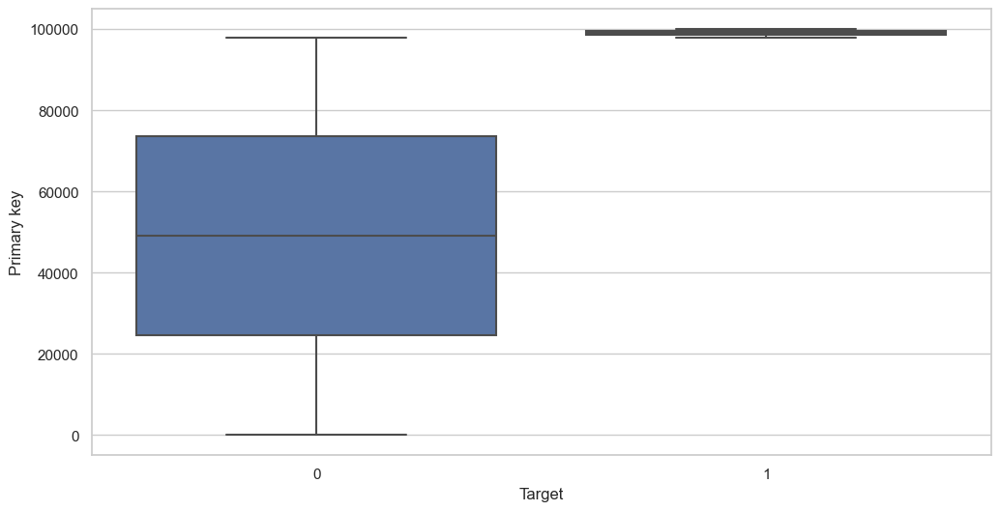

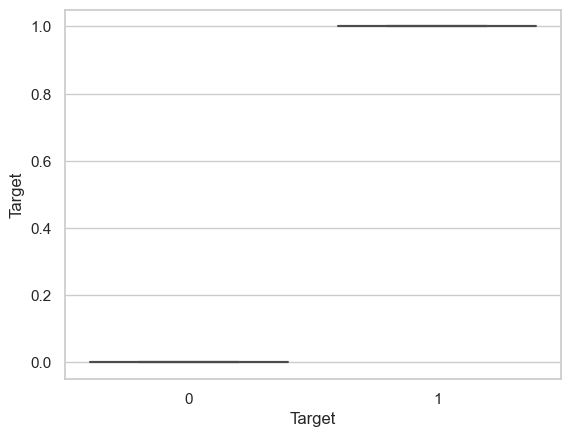

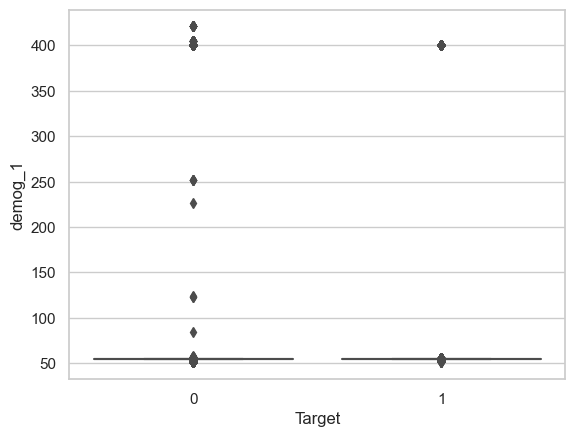

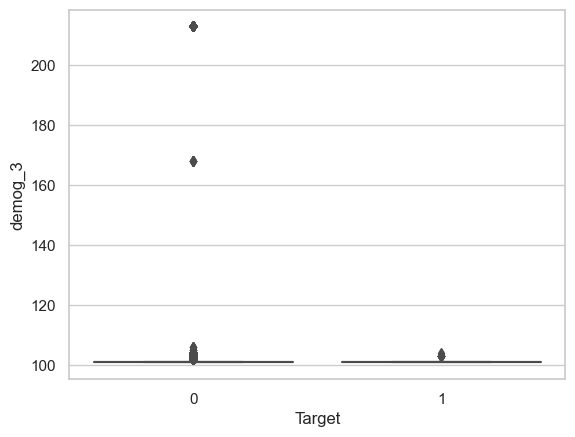

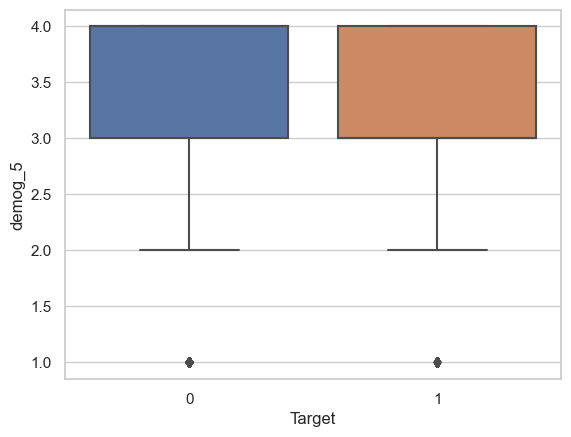

...

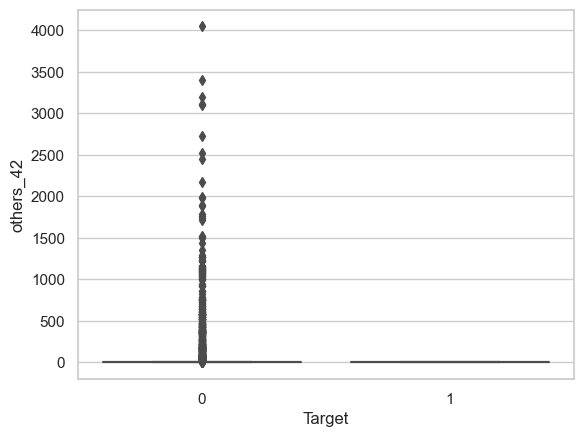

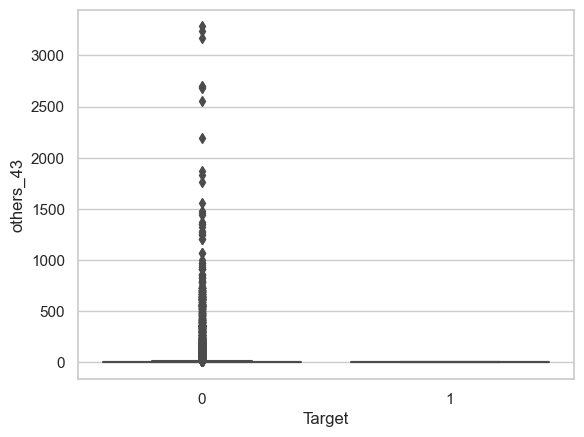

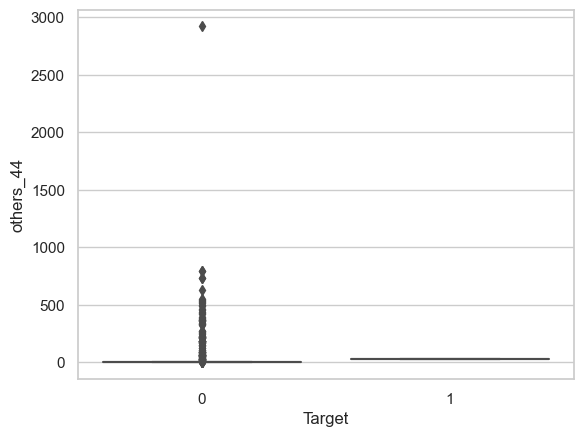

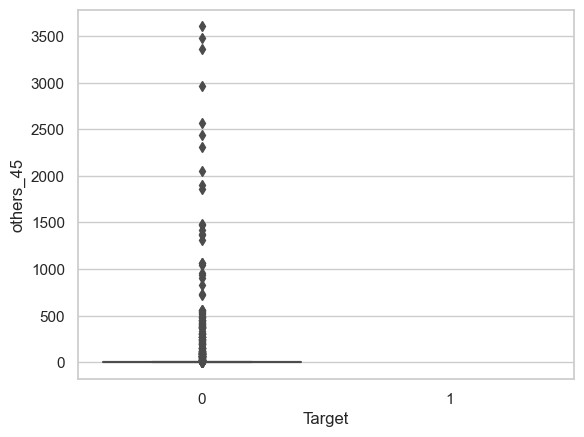

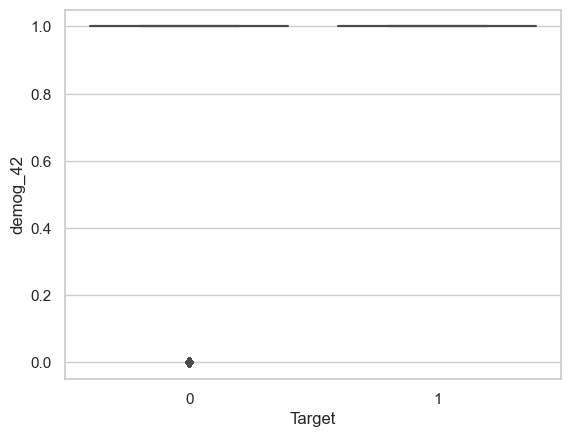

In [15]:
plt.figure(figsize=(12, 6))
for column in numeric_columns:
    sns.boxplot(x='Target', y=column, data=df)
    plt.show()


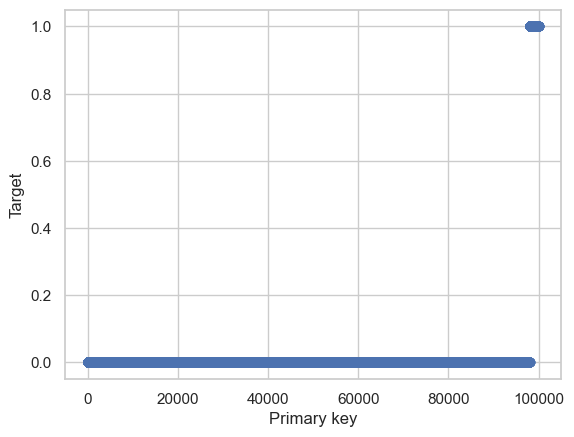

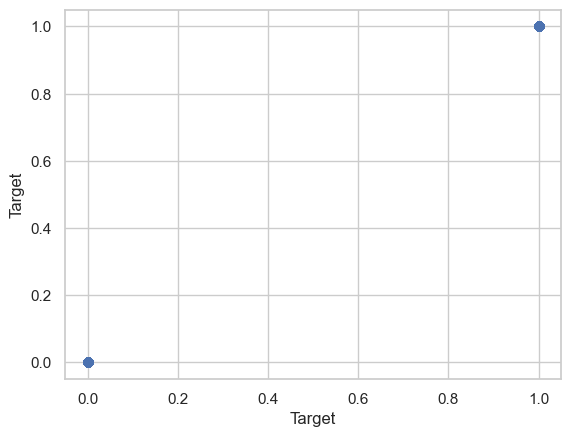

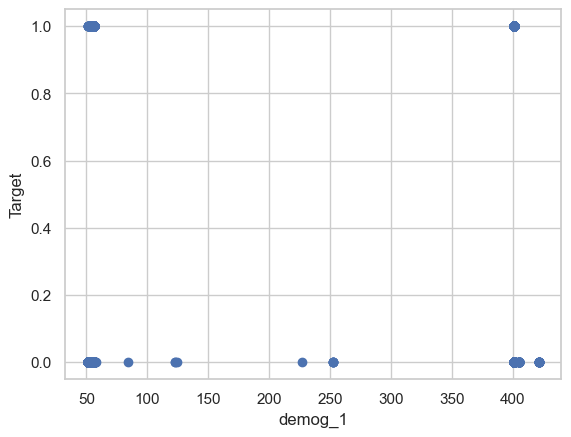

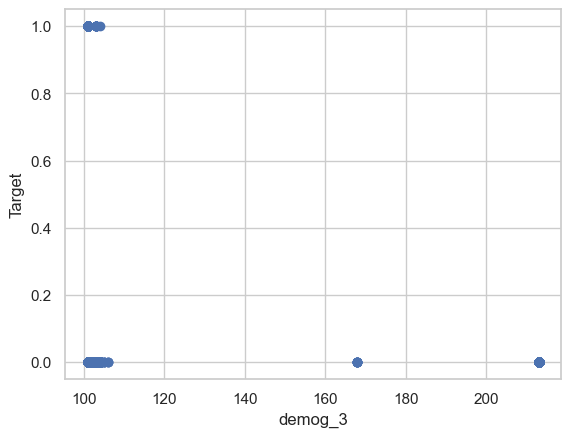

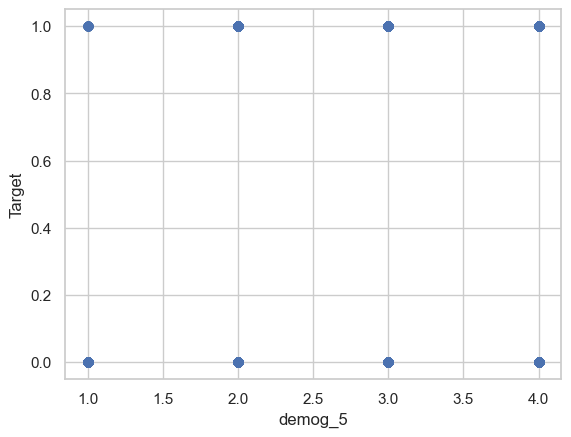

...

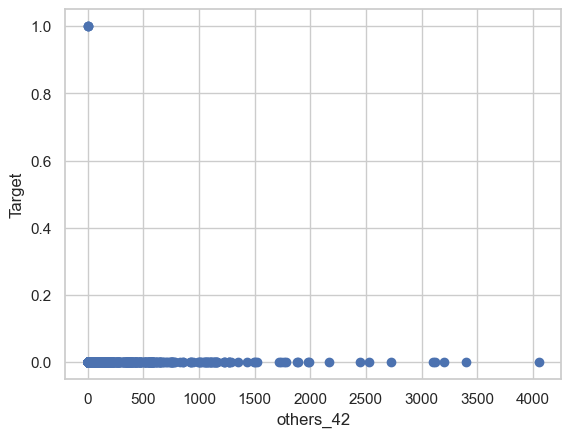

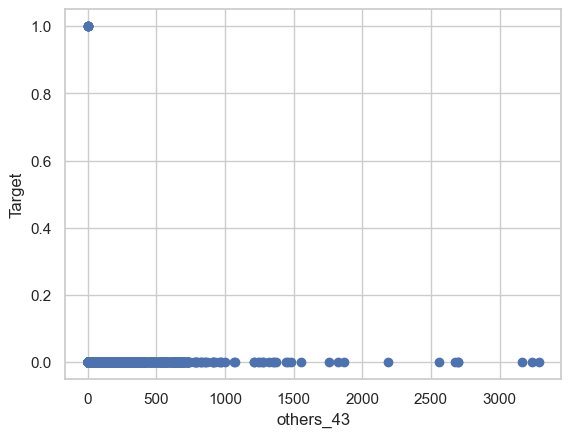

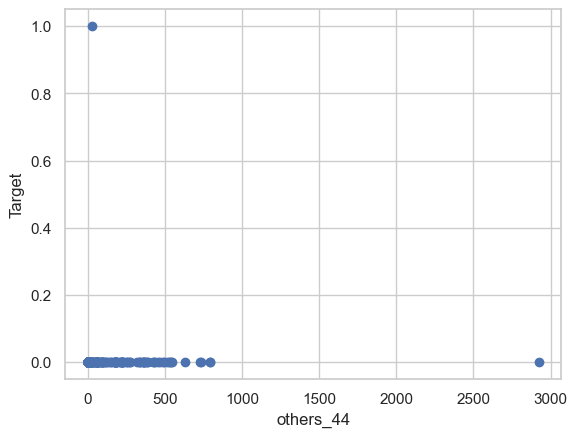

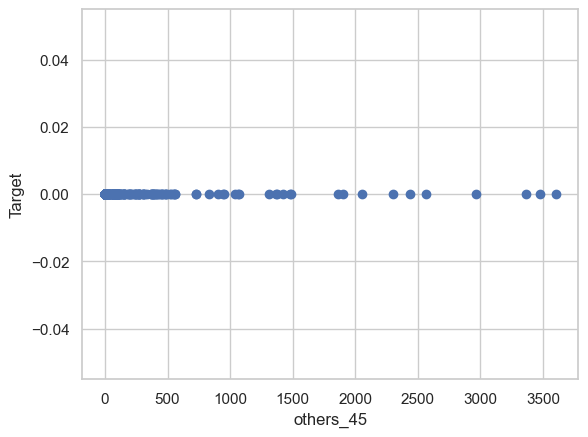

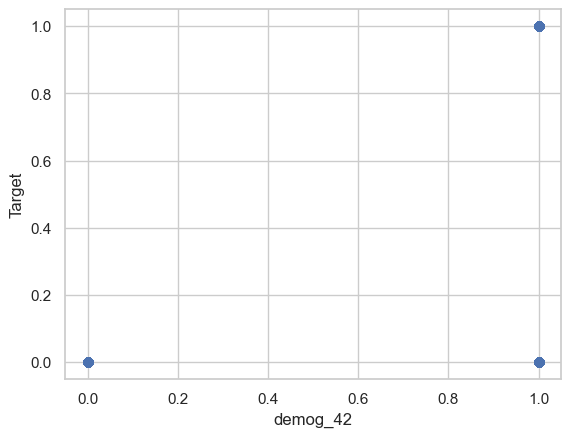

In [16]:
for column in numeric_columns:
    plt.xlabel(column)
    plt.ylabel('Target')
    plt.scatter(x=df[column],y=df['Target'])
    plt.show()

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


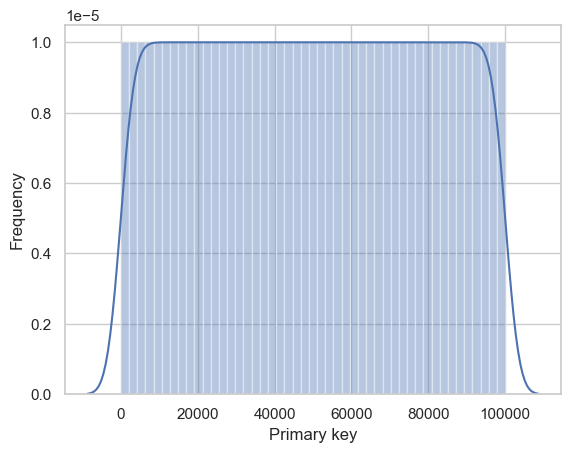

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


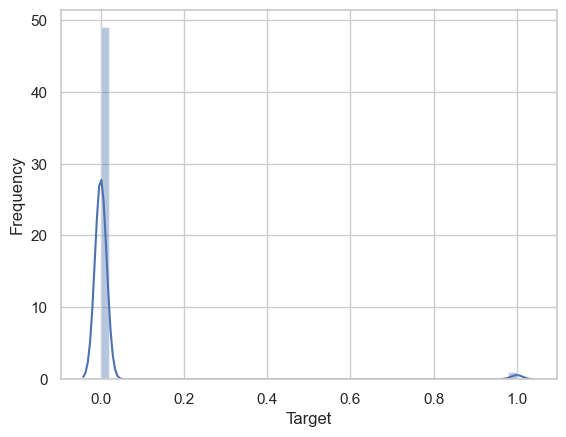

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


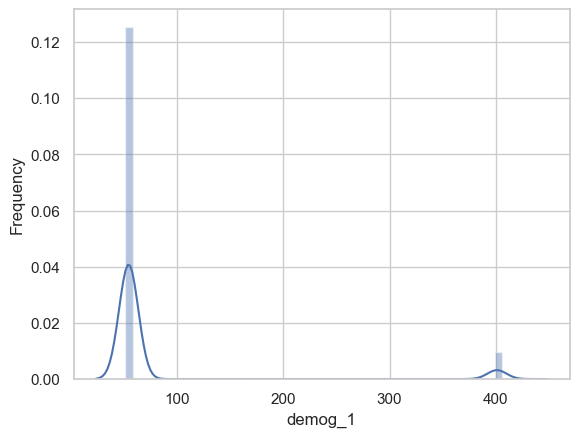

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


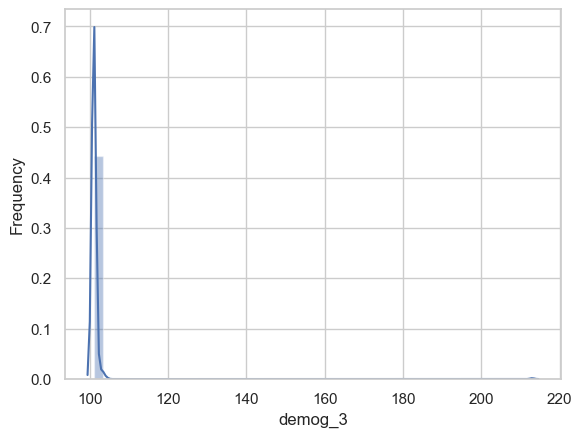

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


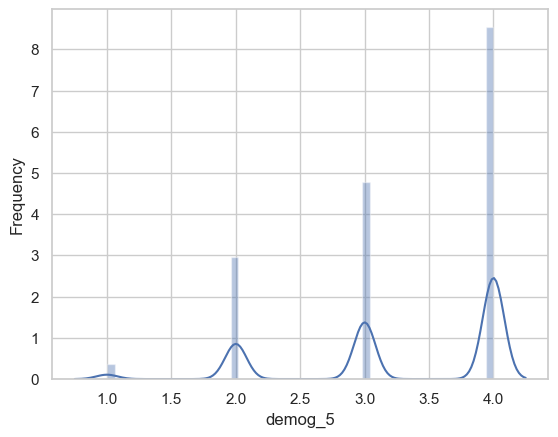

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


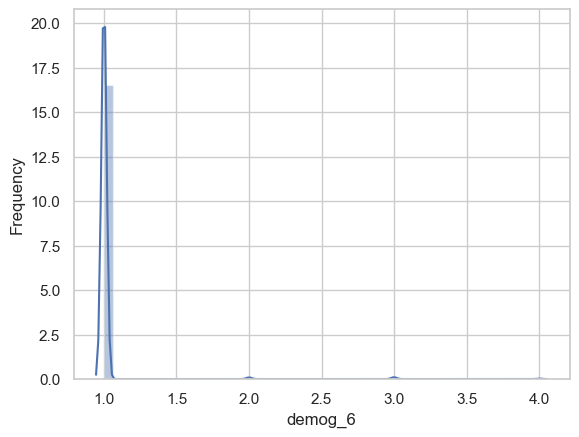

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])
C:\Users\PRATHAM\anaconda3\lib\site-packages\seaborn\distributions.py:2511: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


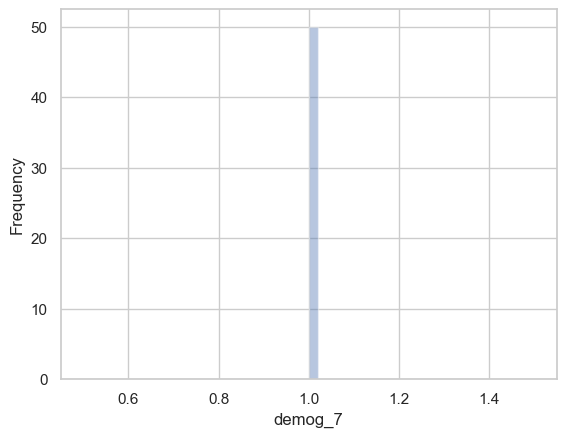

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


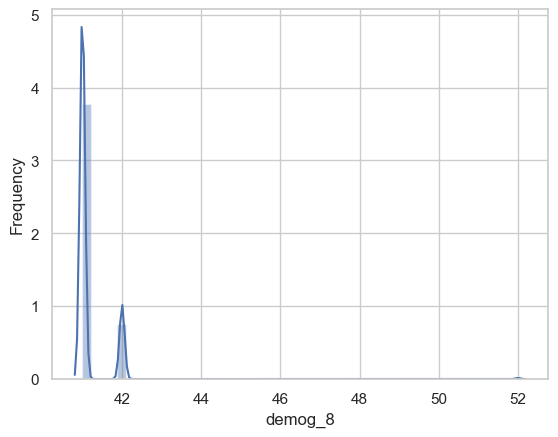

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


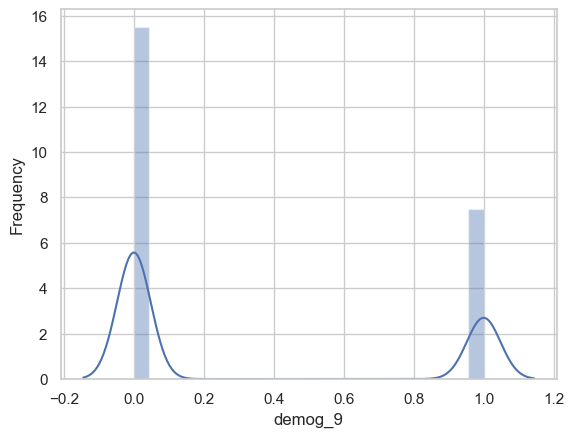

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


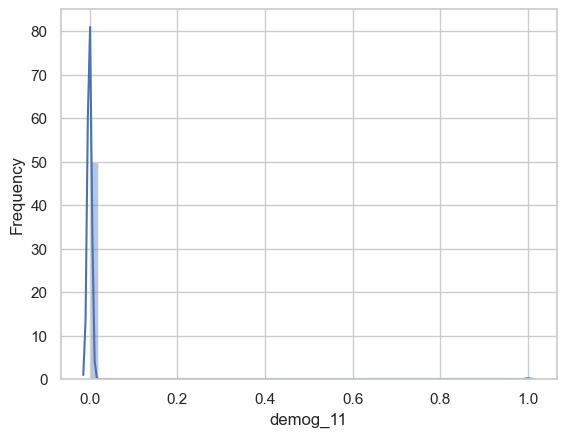

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])
C:\Users\PRATHAM\anaconda3\lib\site-packages\seaborn\distributions.py:2511: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


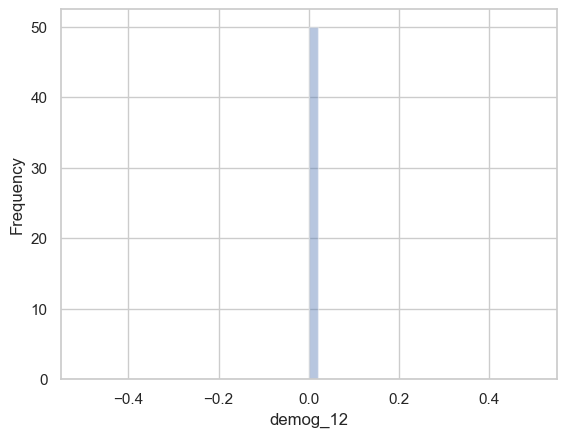

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


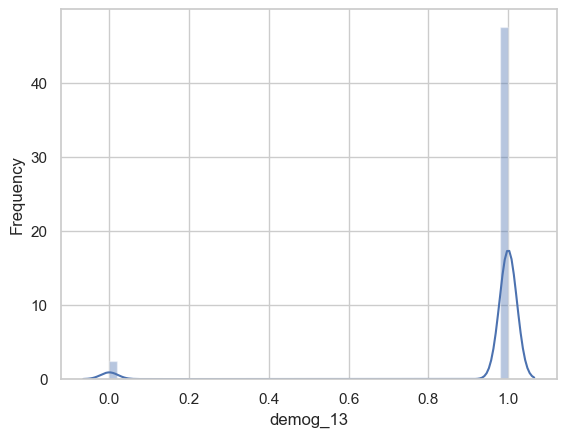

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


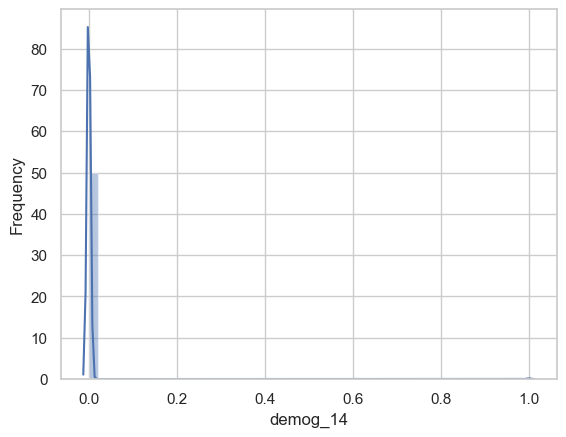

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


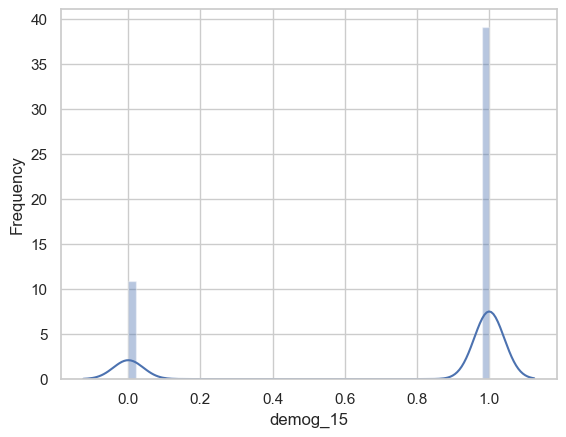

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


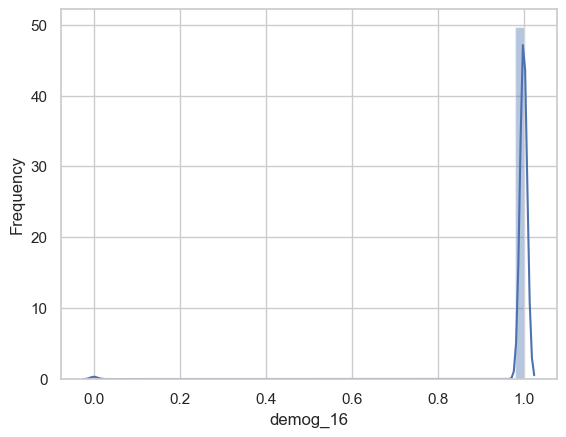

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


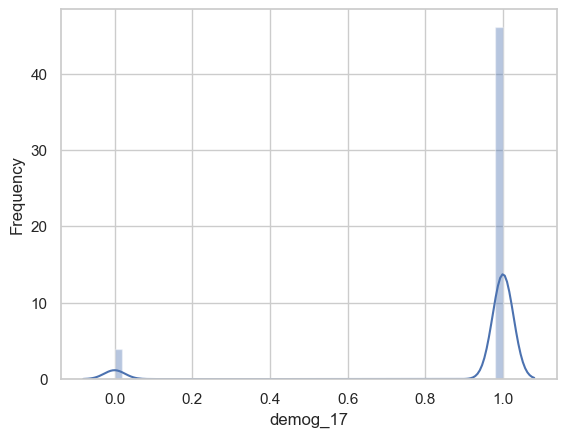

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


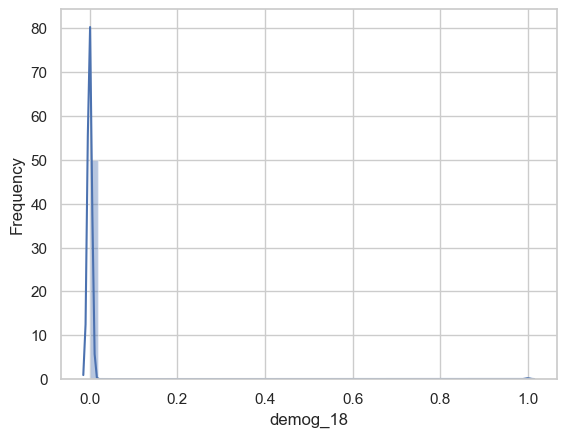

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


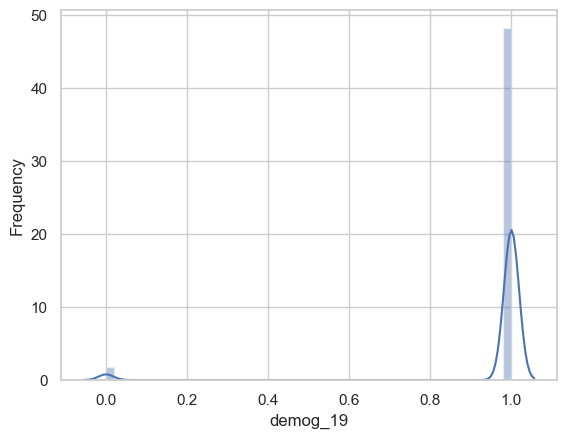

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


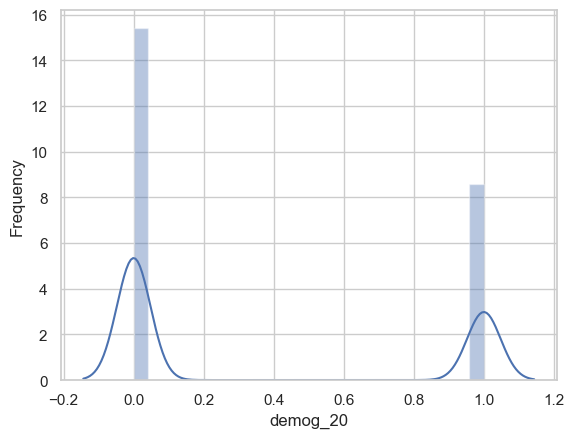

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


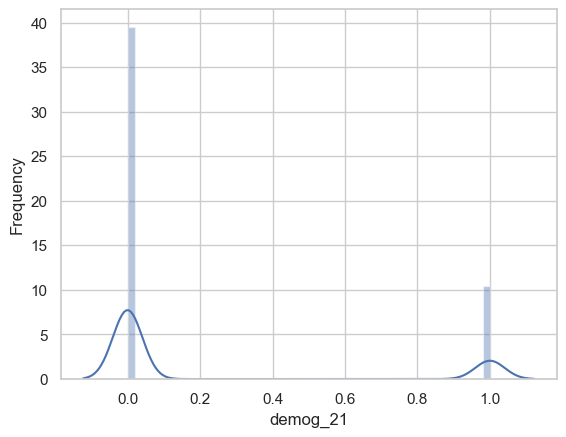

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


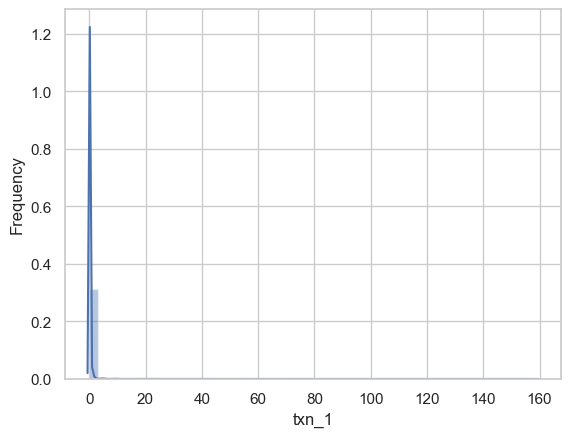

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


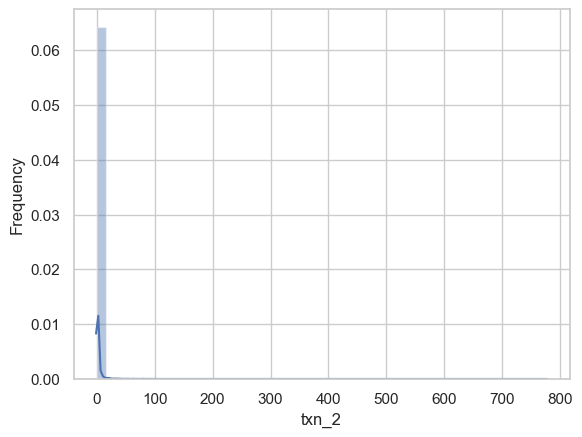

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


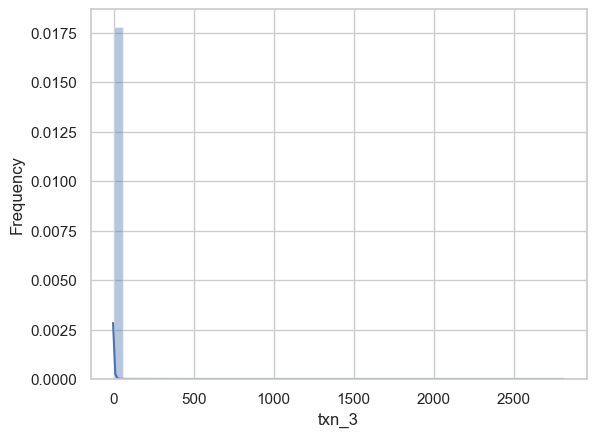

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


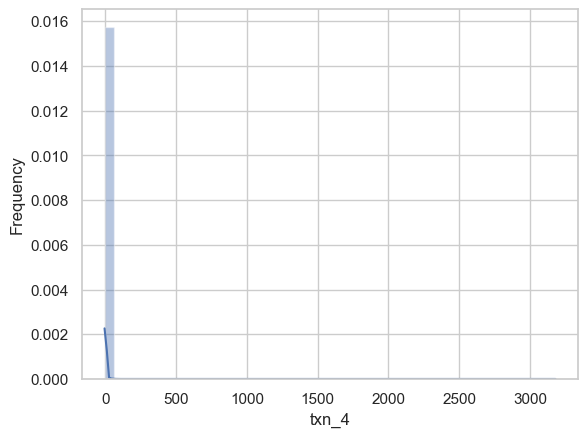

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


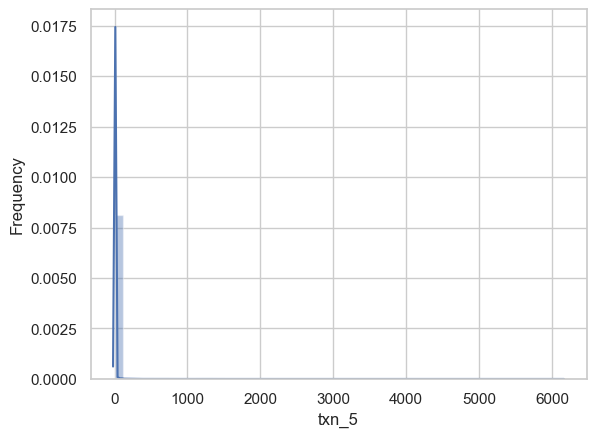

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


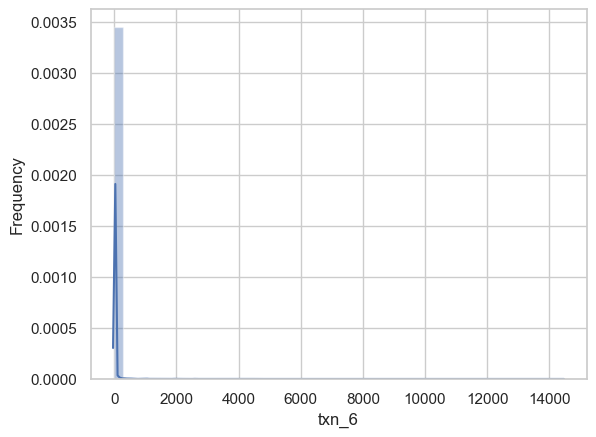

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


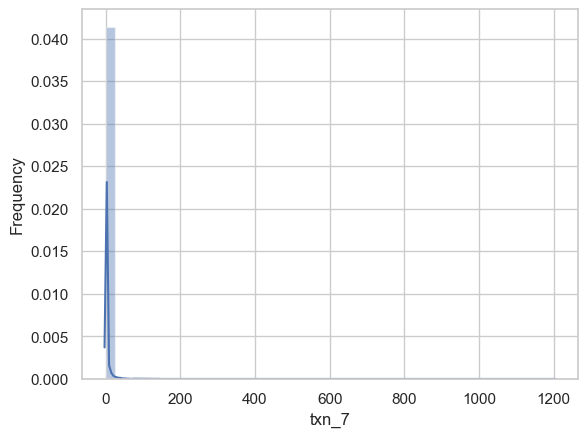

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


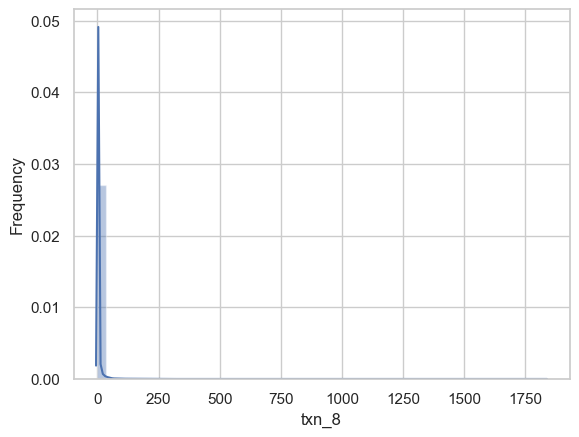

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


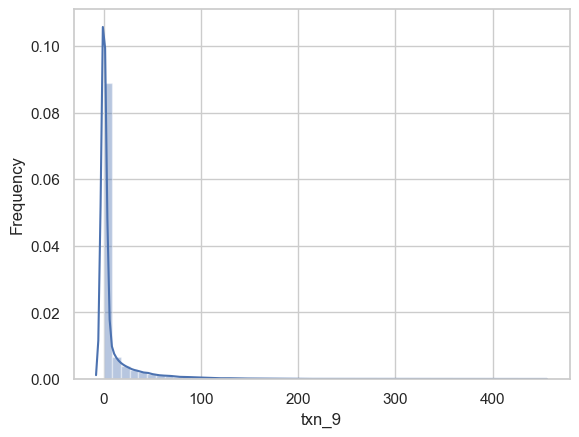

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


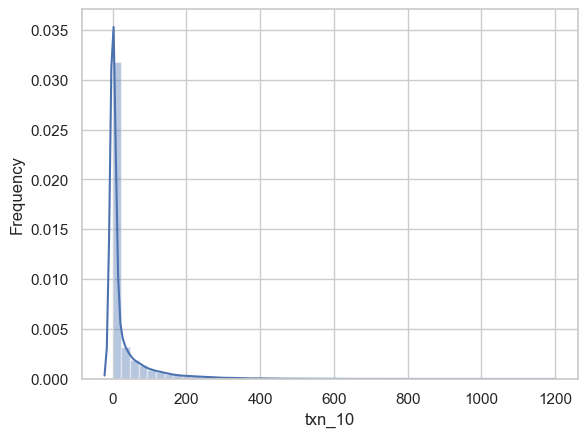

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


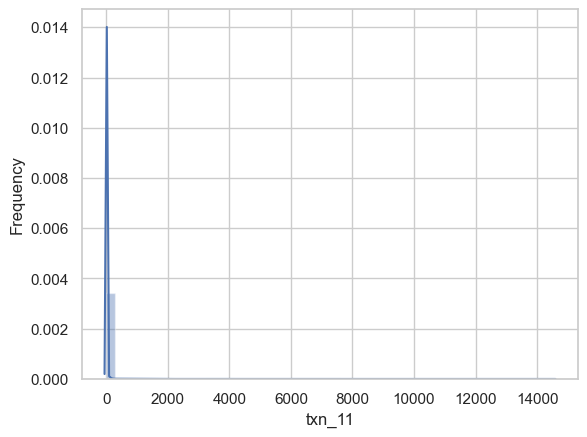

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


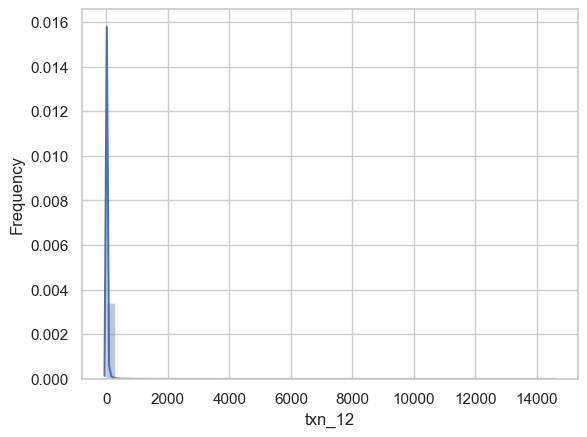

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


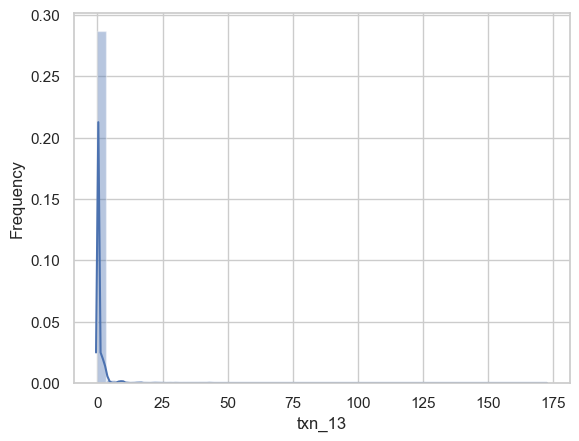

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


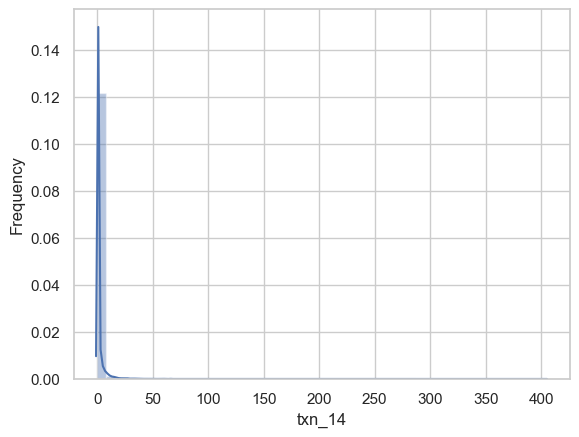

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


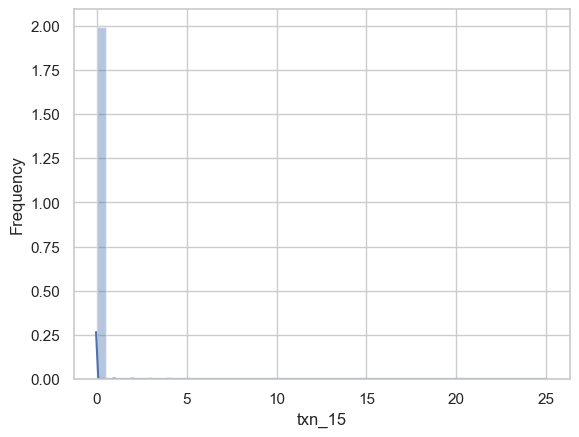

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


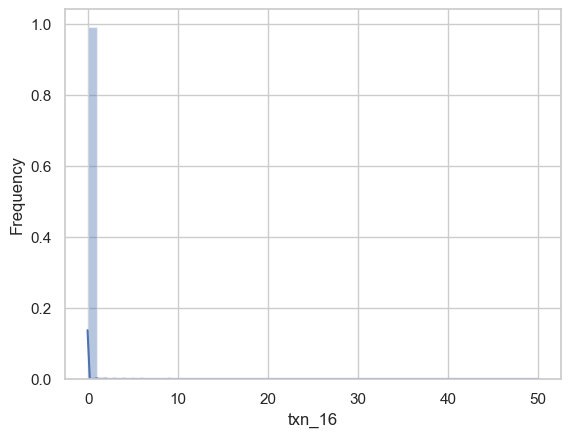

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


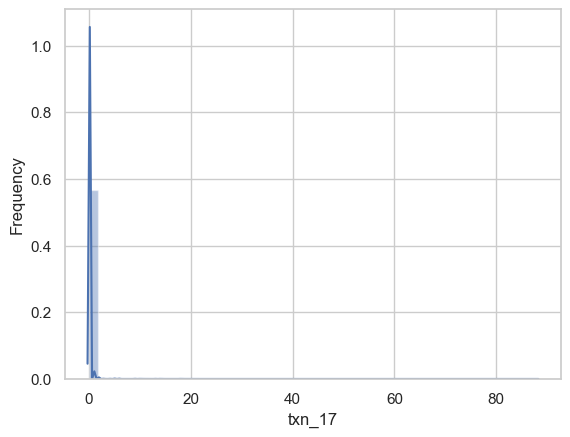

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


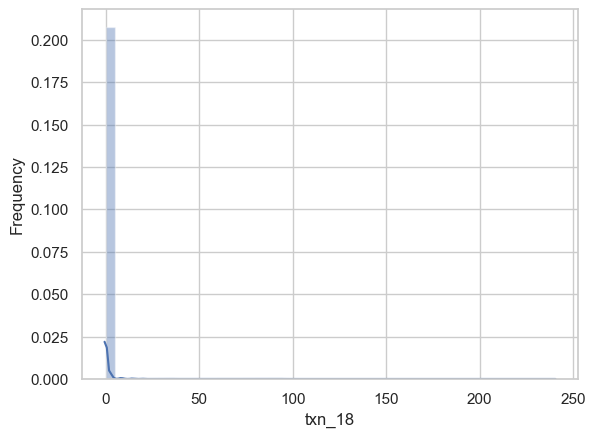

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


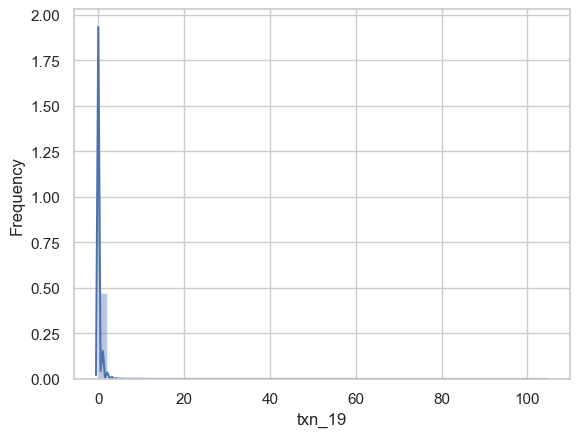

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


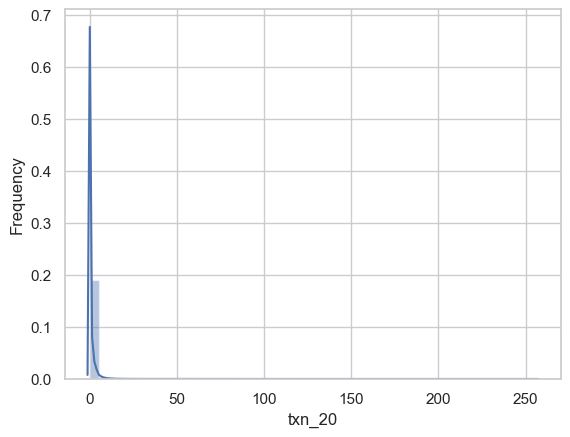

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


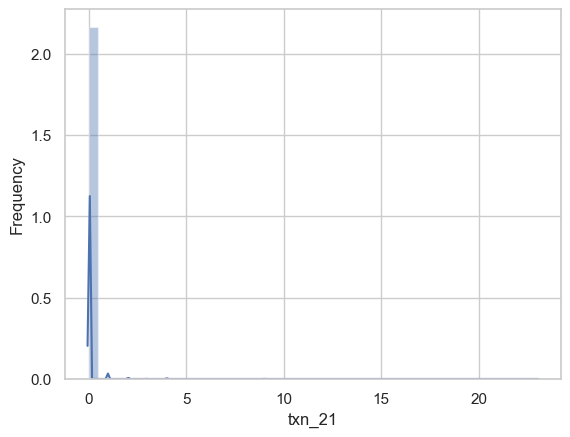

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


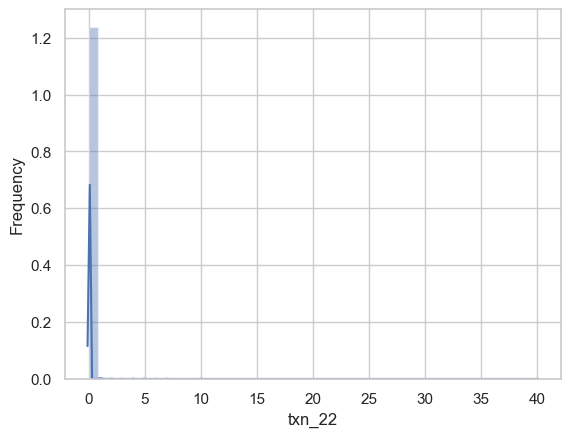

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


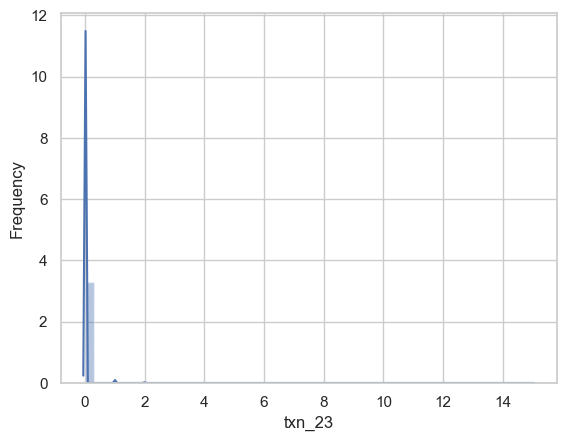

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


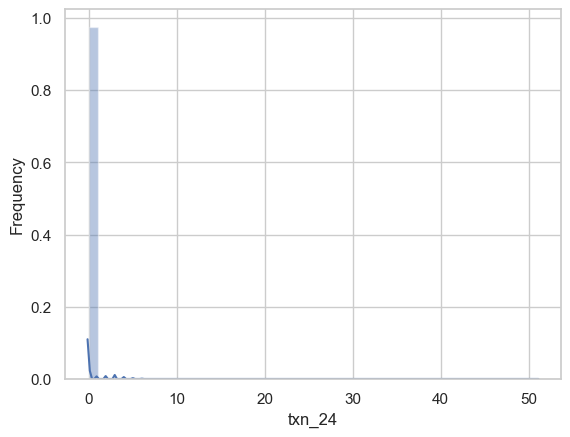

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


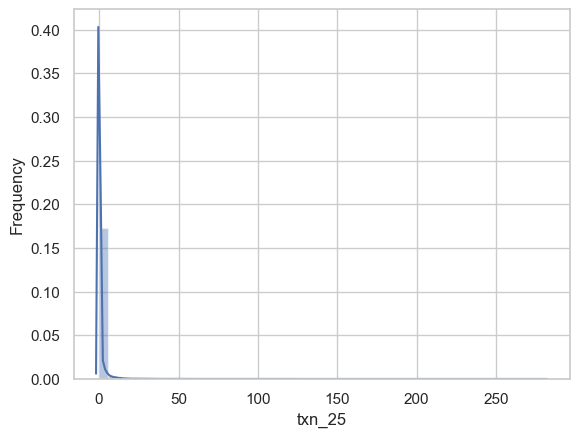

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


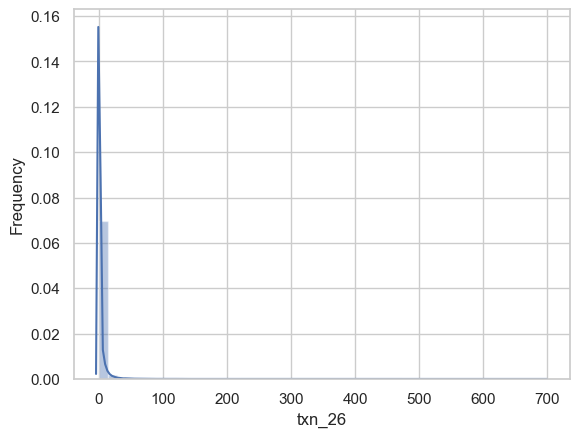

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


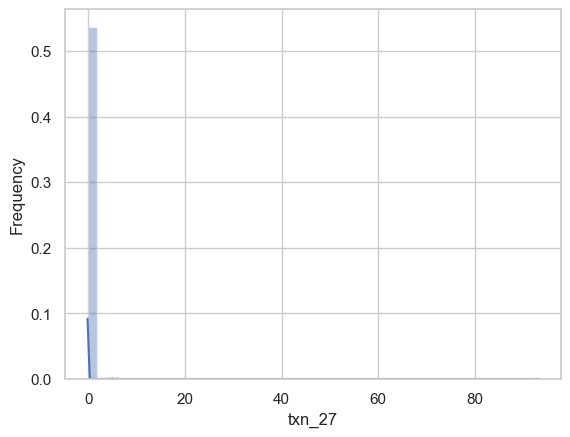

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


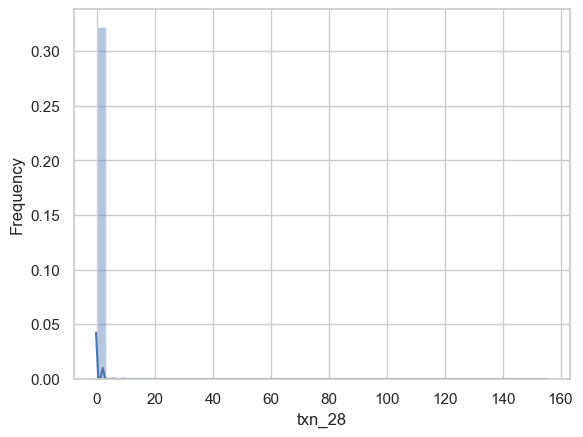

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


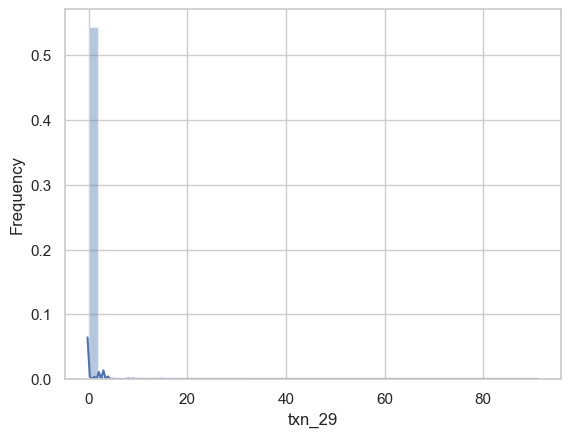

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


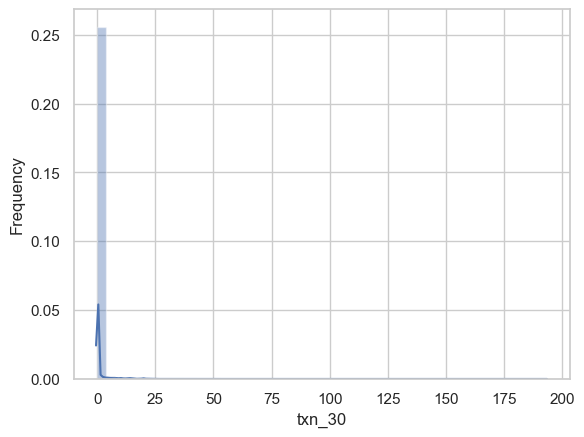

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


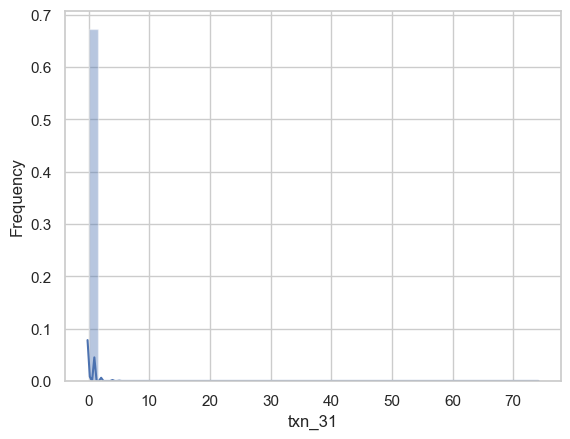

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


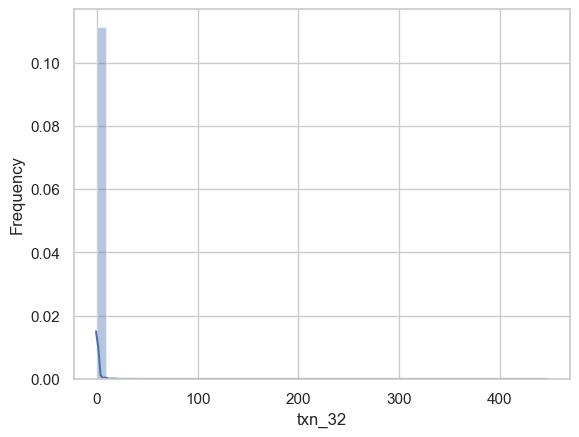

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


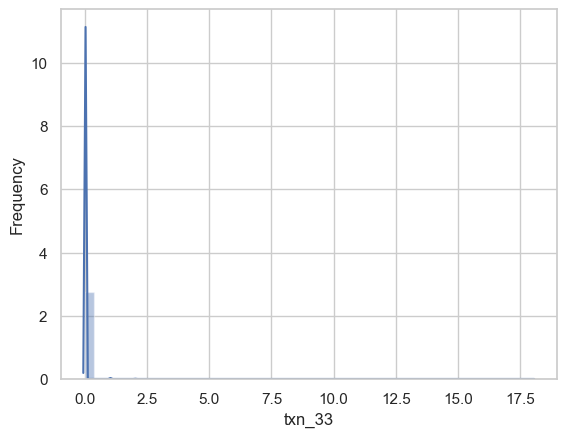

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


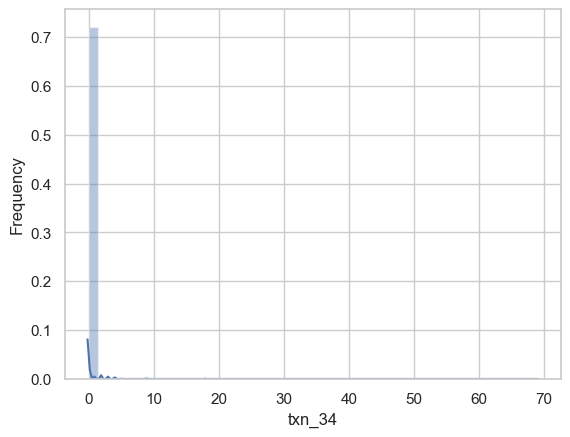

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])
C:\Users\PRATHAM\anaconda3\lib\site-packages\seaborn\distributions.py:2511: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


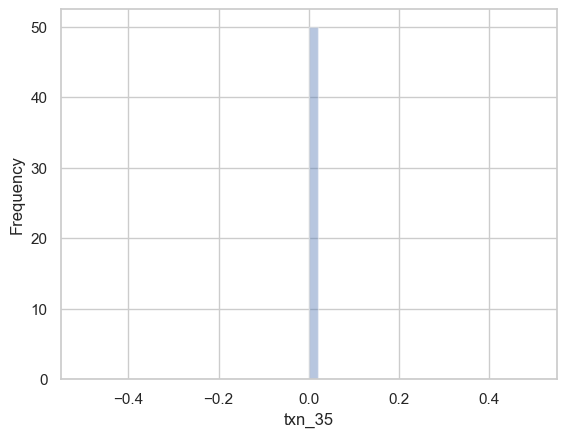

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])
C:\Users\PRATHAM\anaconda3\lib\site-packages\seaborn\distributions.py:2511: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


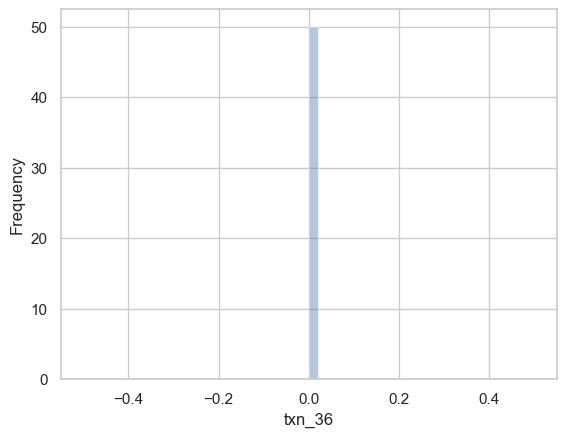

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


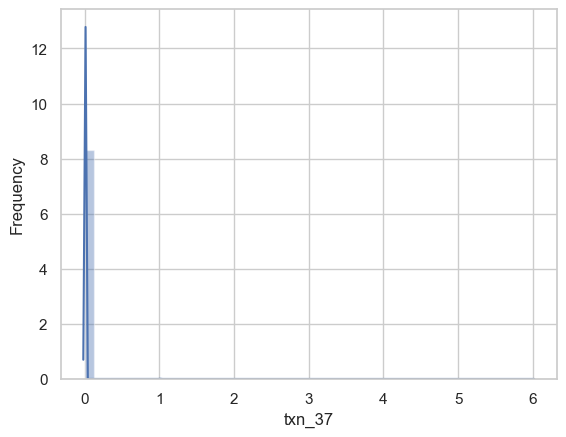

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


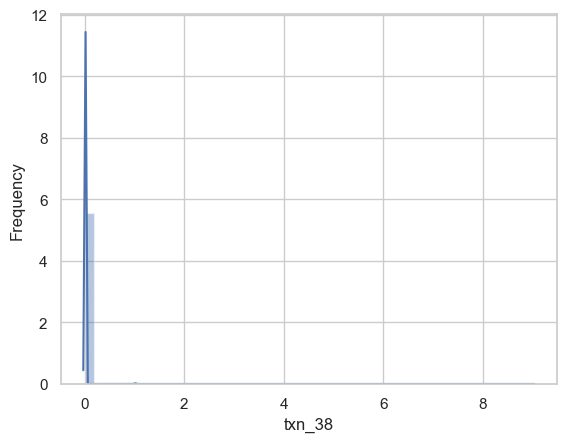

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


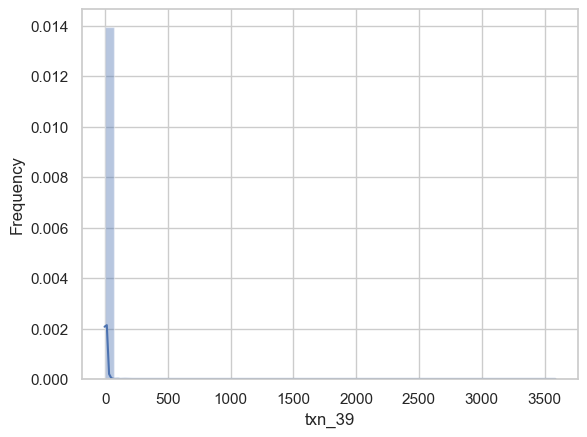

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


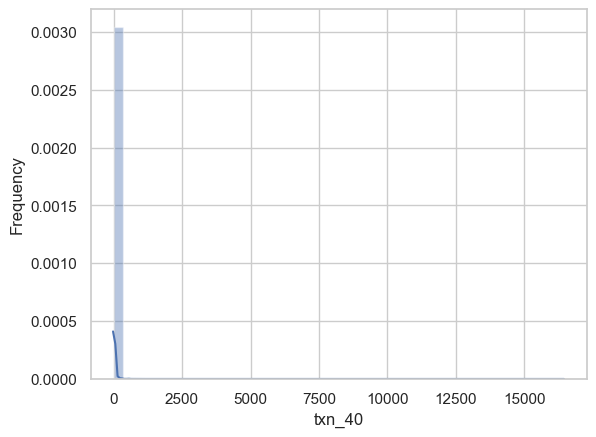

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


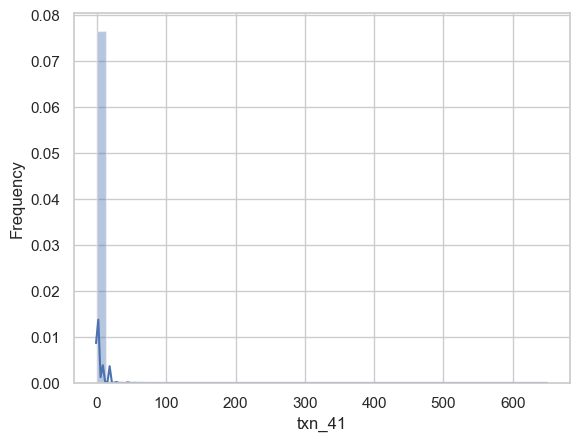

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


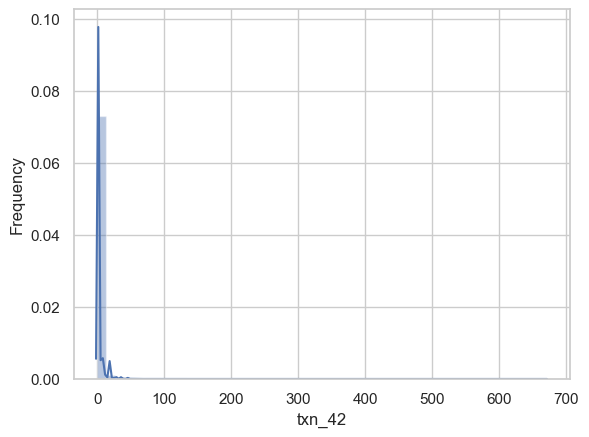

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


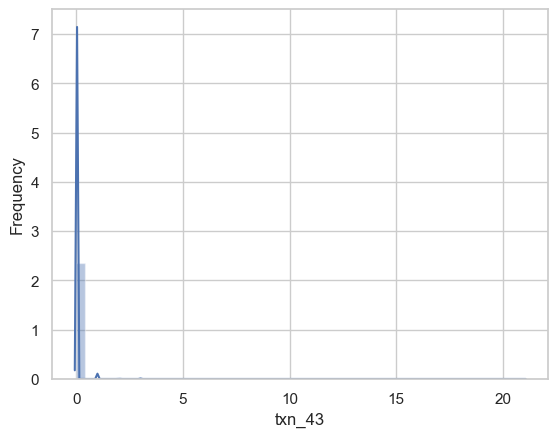

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


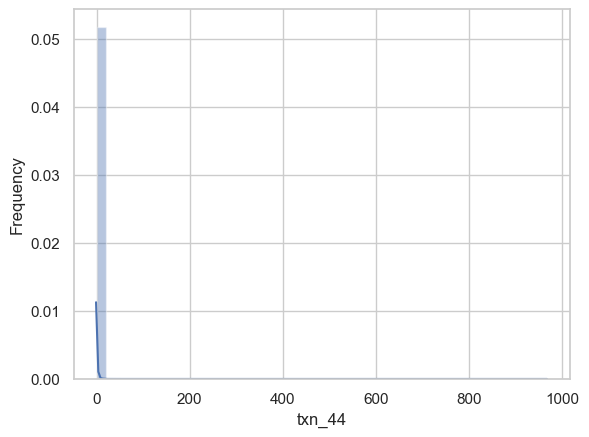

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


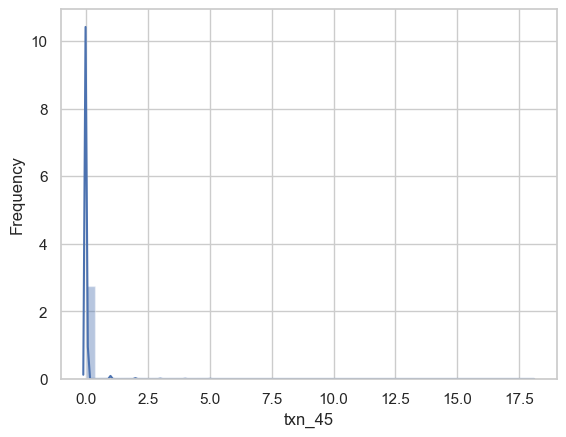

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


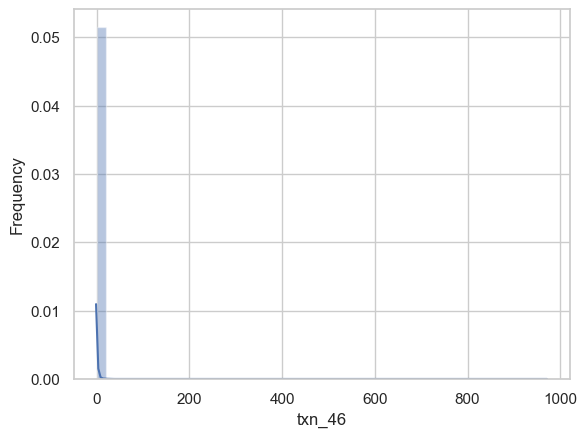

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


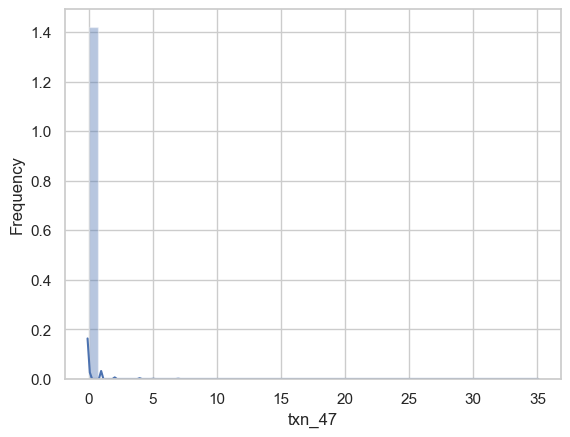

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


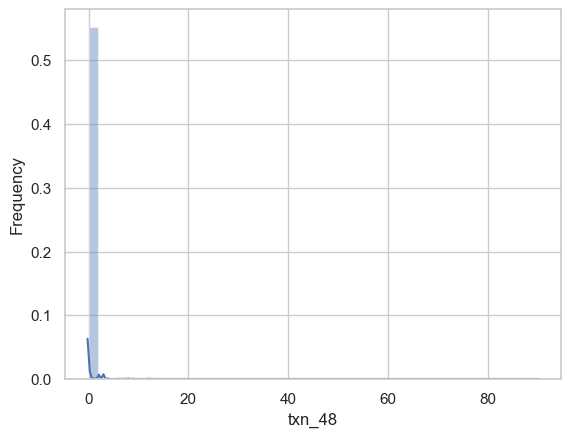

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])
C:\Users\PRATHAM\anaconda3\lib\site-packages\seaborn\distributions.py:2511: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


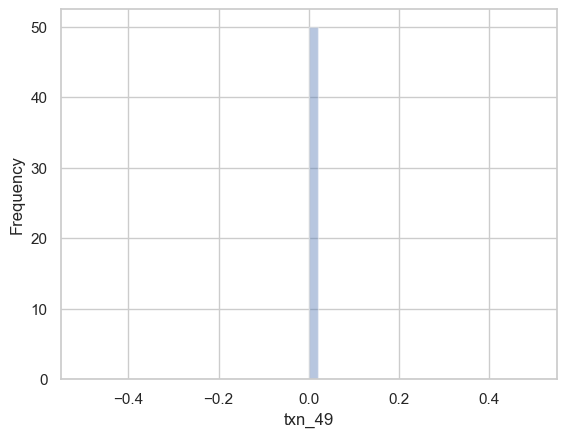

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])
C:\Users\PRATHAM\anaconda3\lib\site-packages\seaborn\distributions.py:2511: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


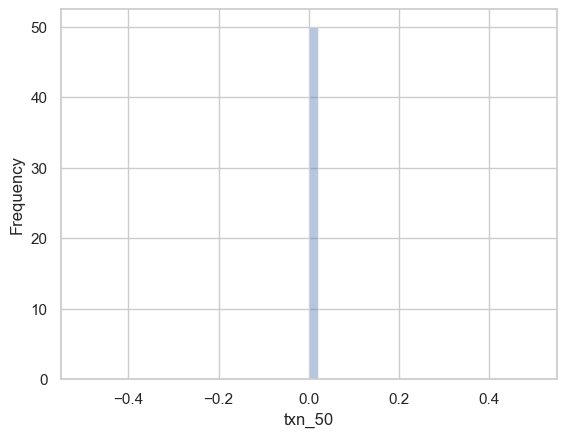

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


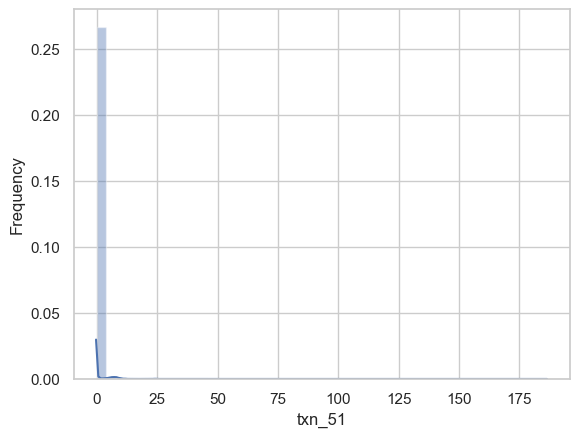

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


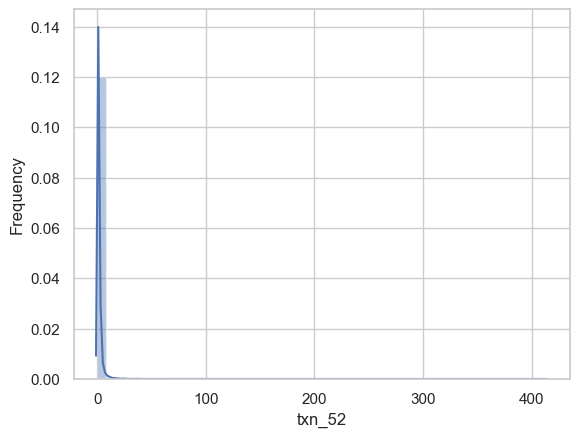

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


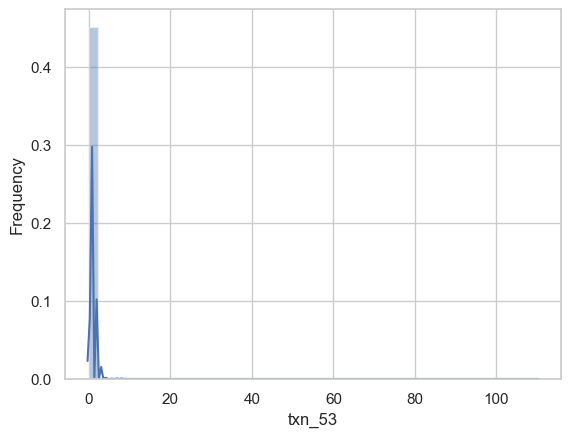

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


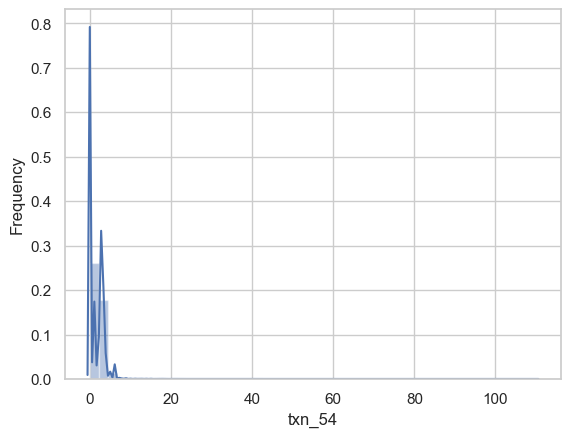

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


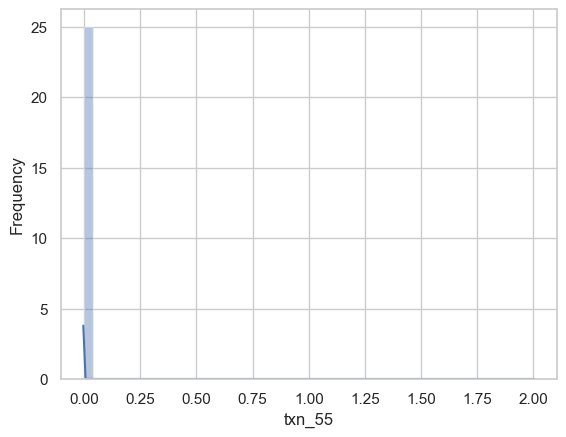

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


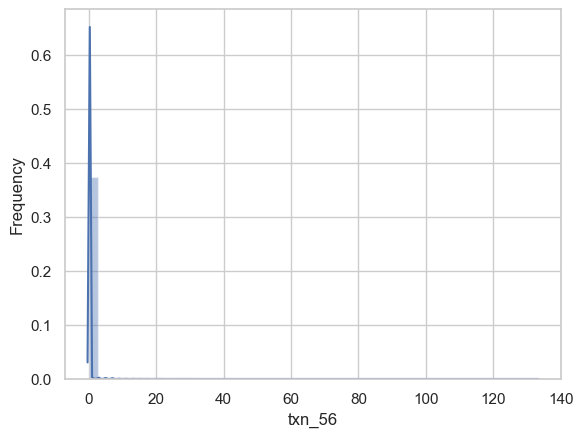

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


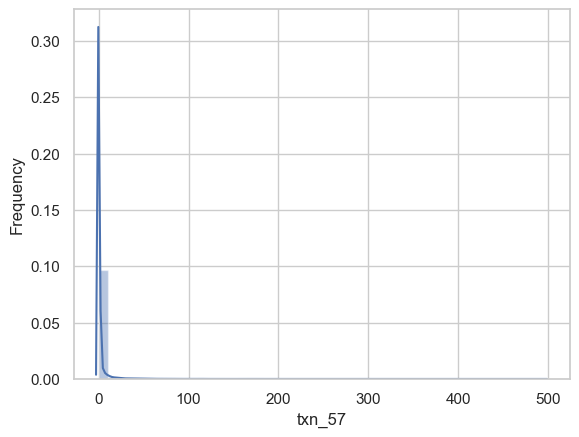

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


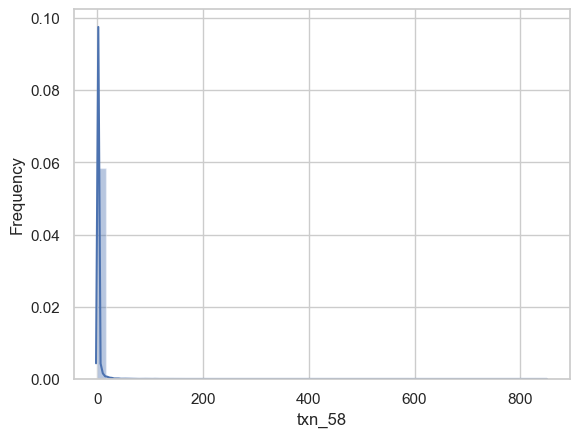

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


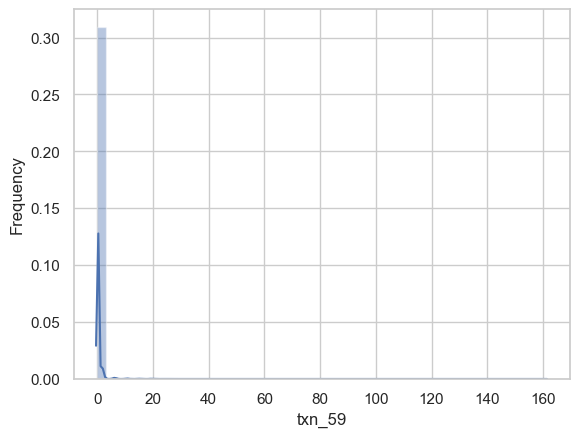

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


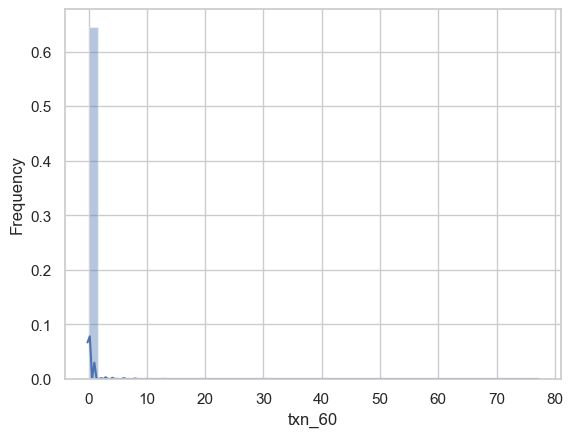

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


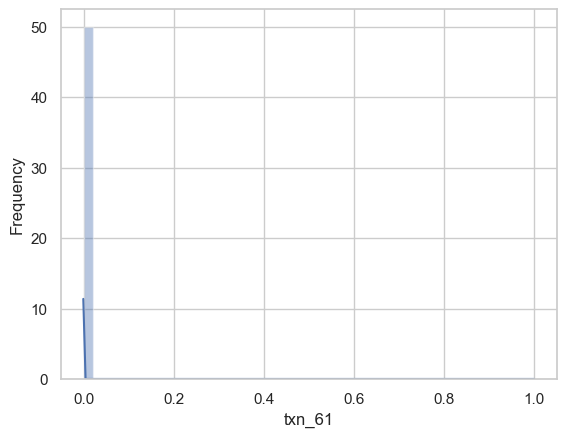

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


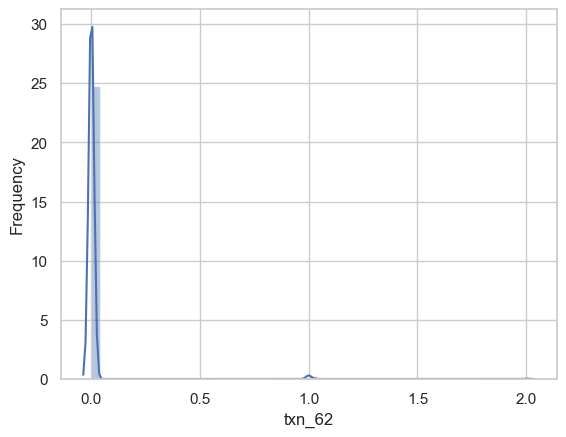

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


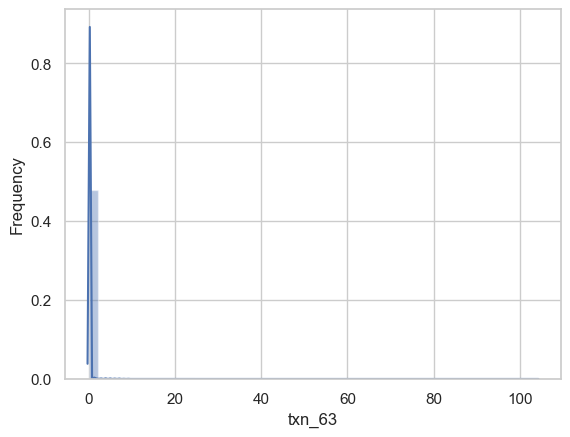

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


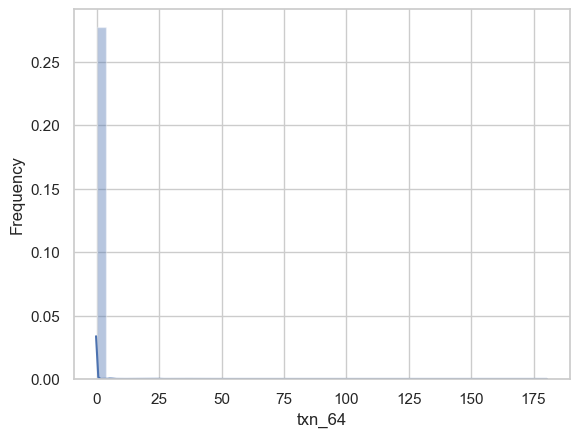

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])
C:\Users\PRATHAM\anaconda3\lib\site-packages\seaborn\distributions.py:2511: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


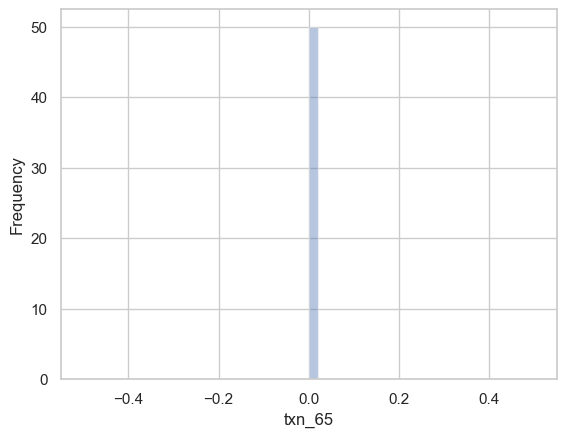

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


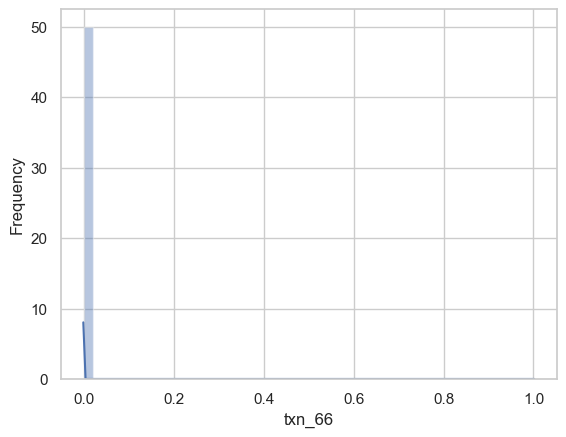

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


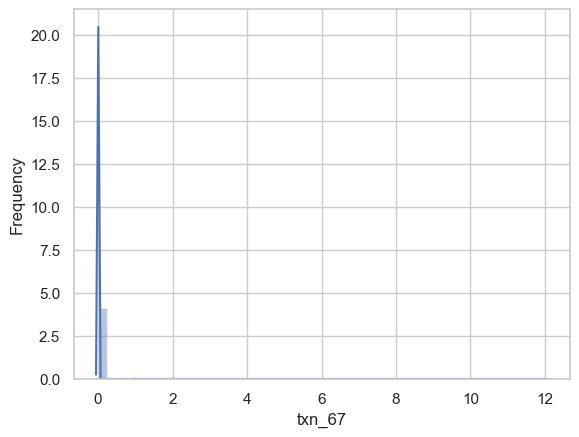

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


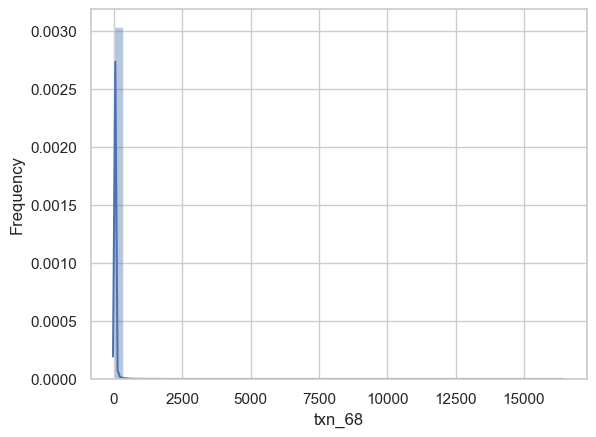

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


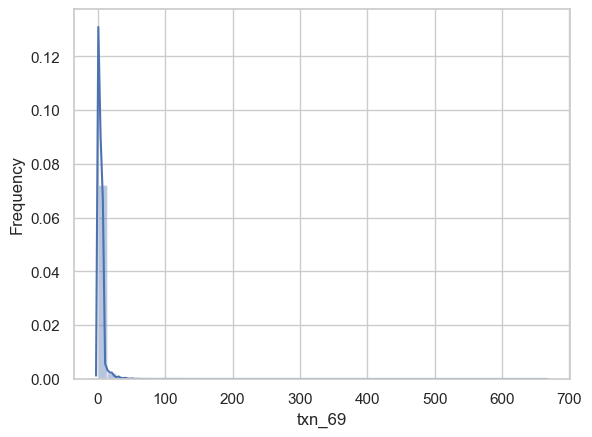

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])
C:\Users\PRATHAM\anaconda3\lib\site-packages\seaborn\distributions.py:2511: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


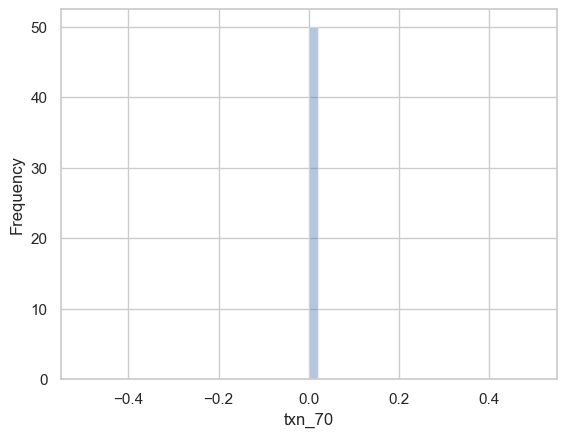

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])
C:\Users\PRATHAM\anaconda3\lib\site-packages\seaborn\distributions.py:2511: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


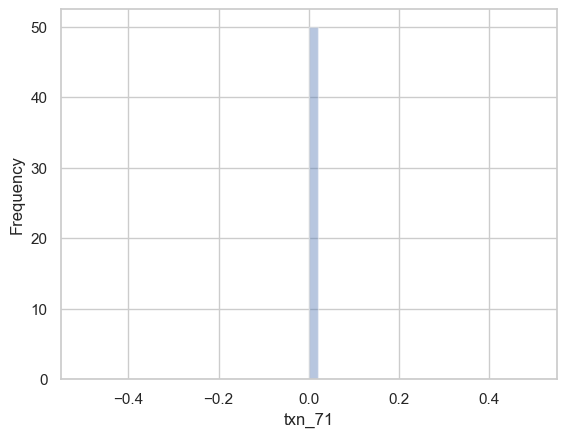

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])
C:\Users\PRATHAM\anaconda3\lib\site-packages\seaborn\distributions.py:2511: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


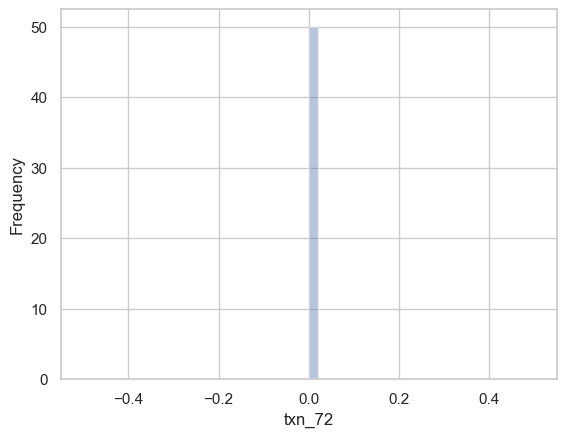

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


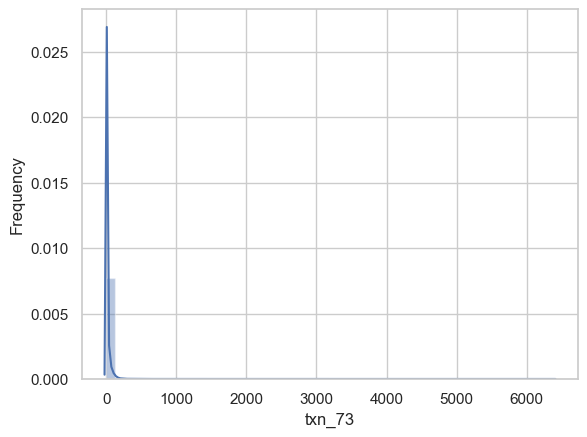

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


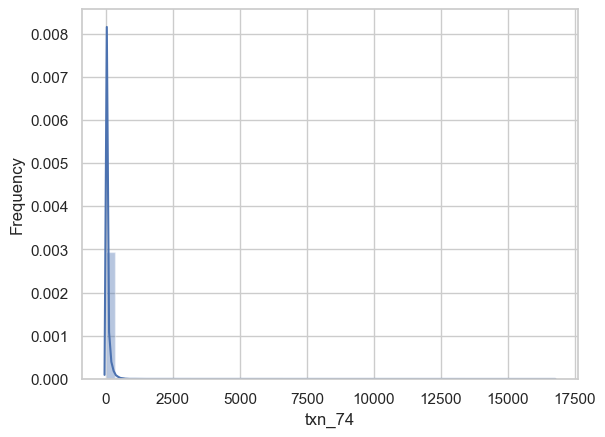

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


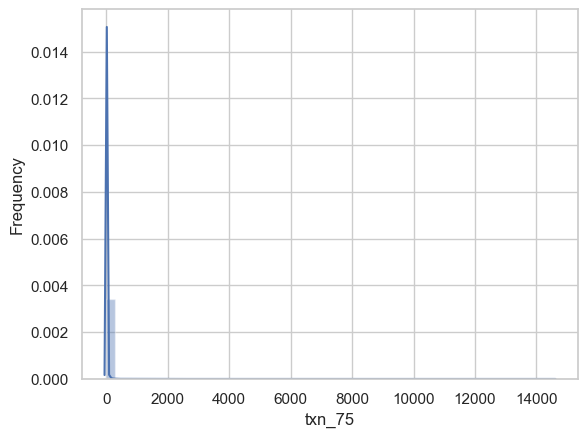

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


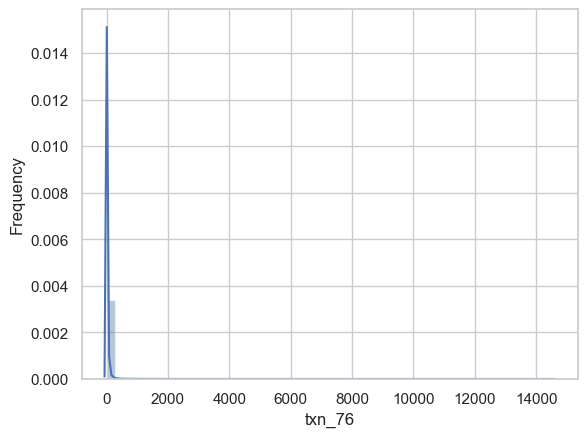

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


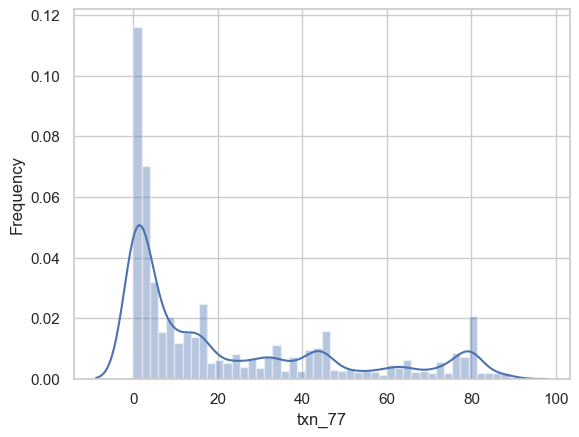

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


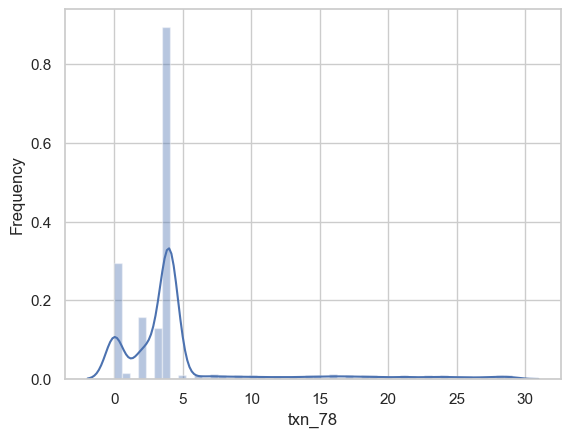

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


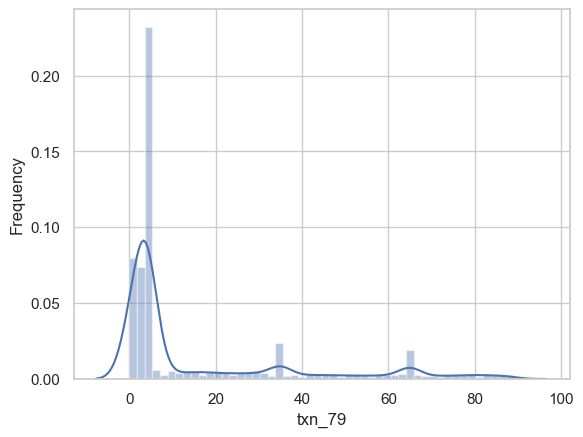

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


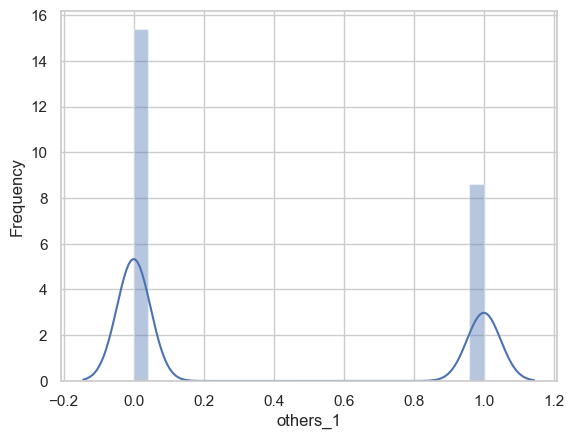

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


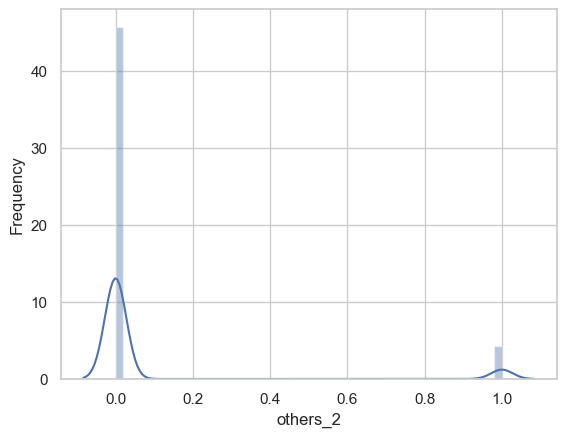

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


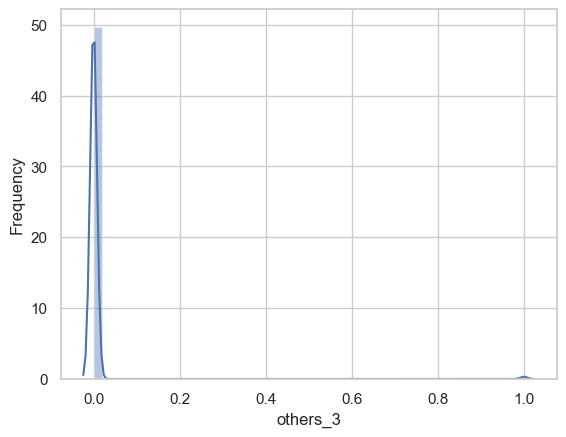

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


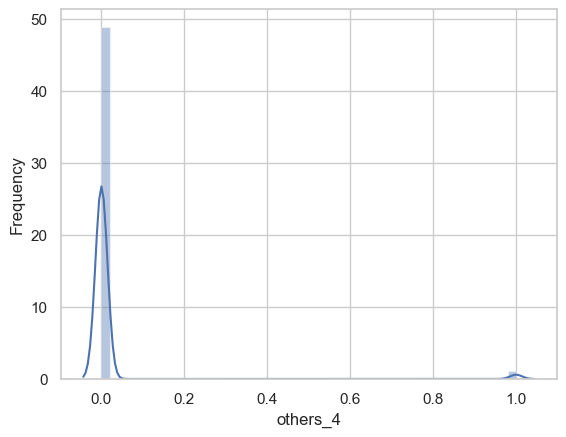

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


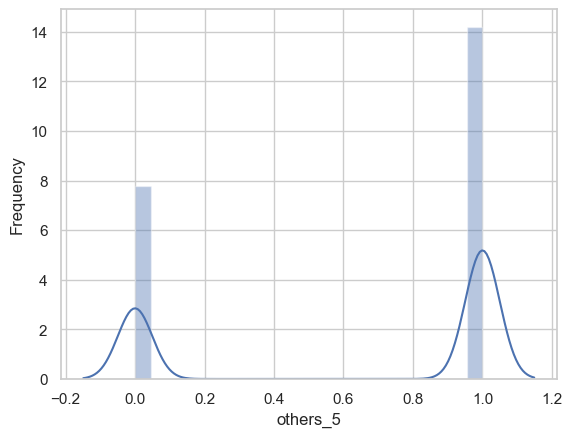

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


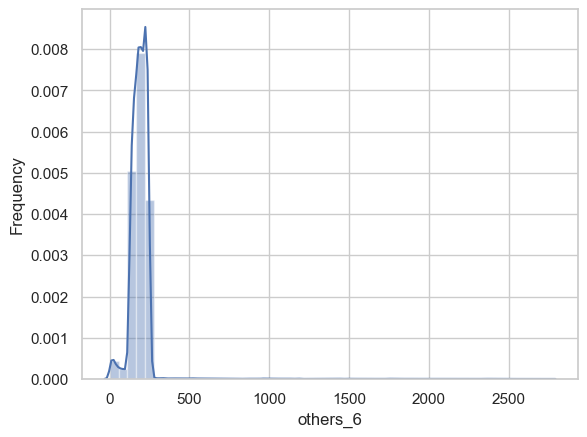

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


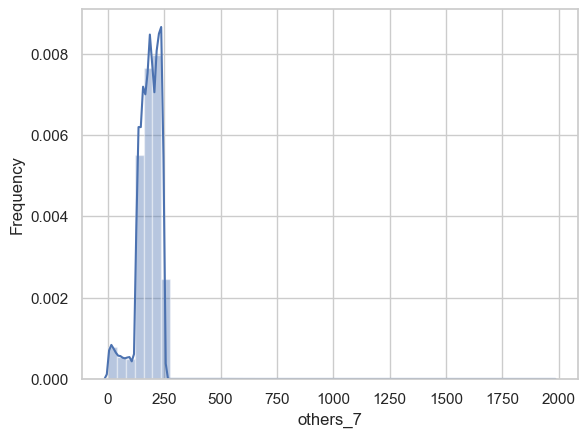

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


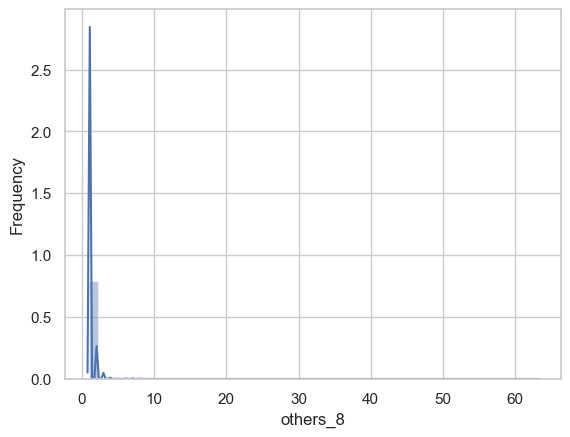

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


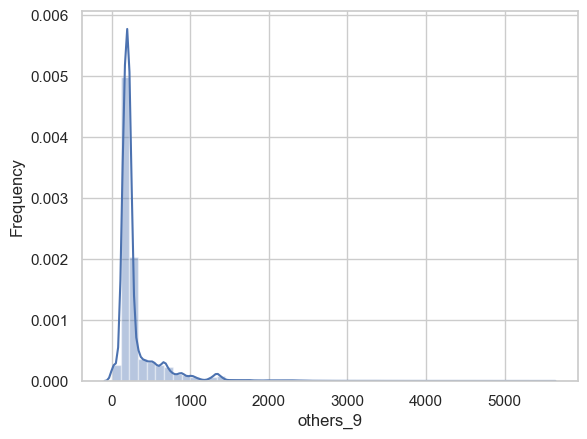

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


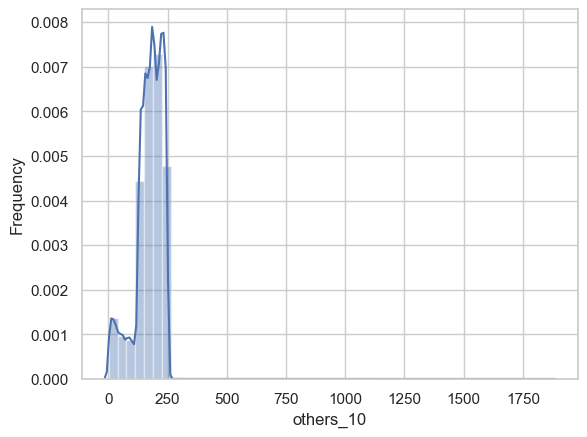

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


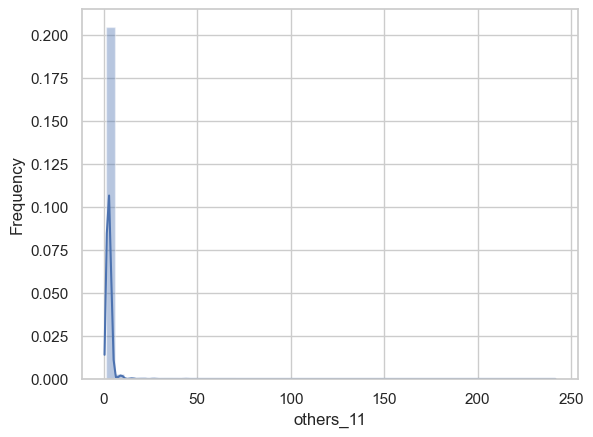

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


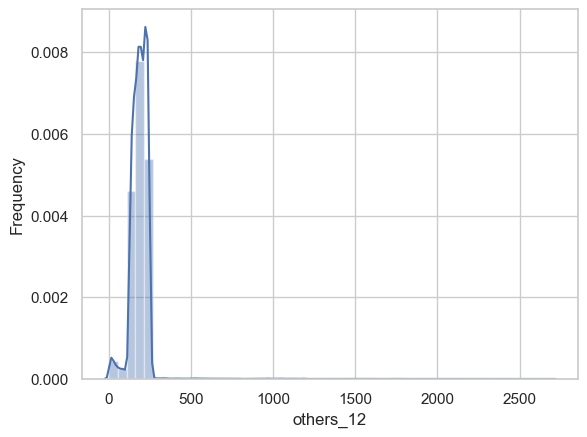

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


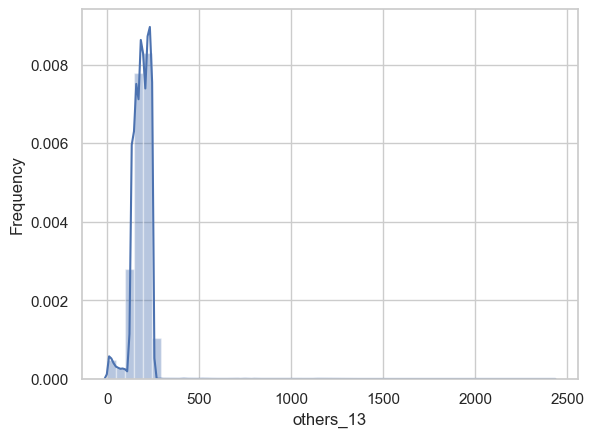

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


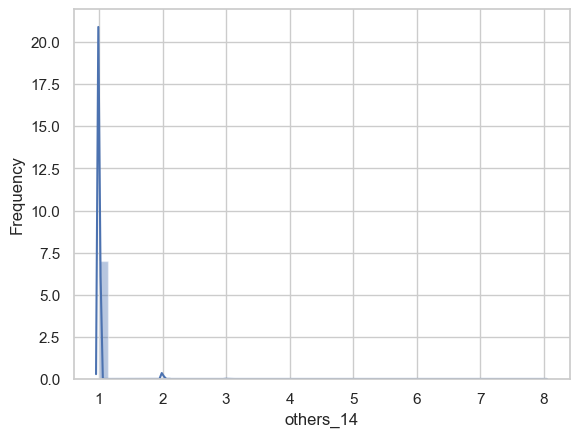

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


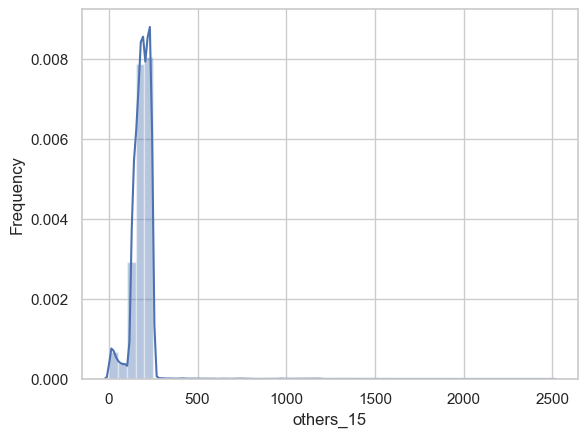

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


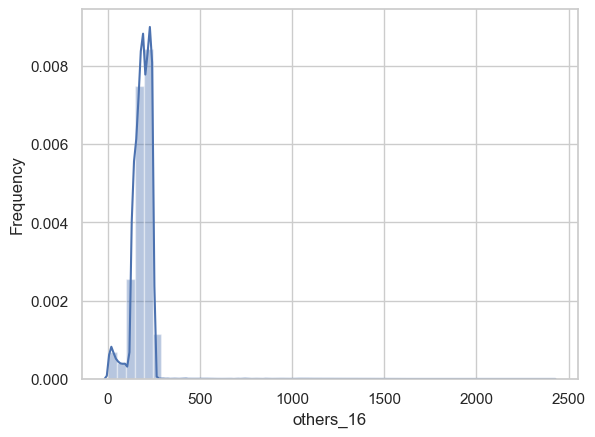

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


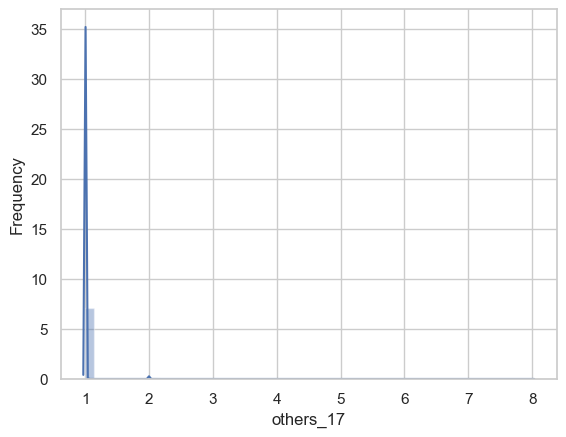

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


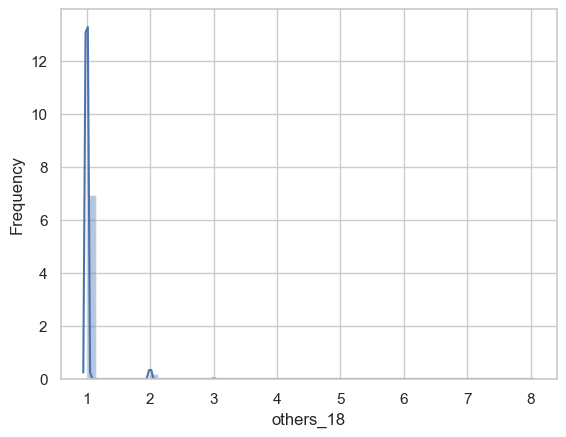

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


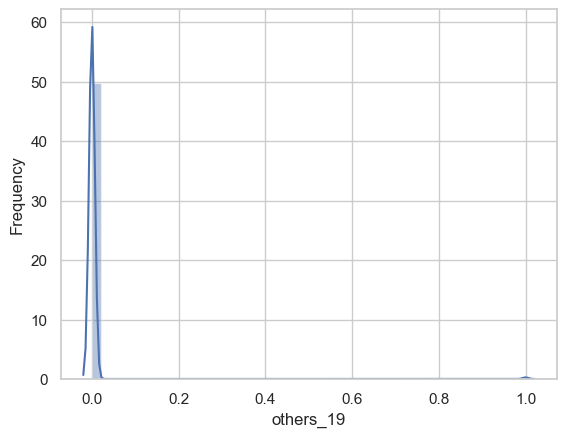

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


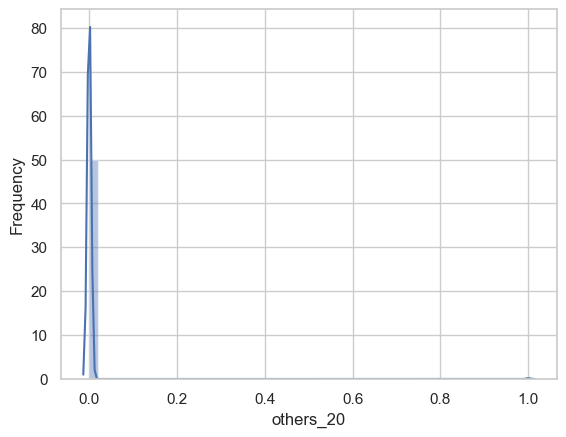

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


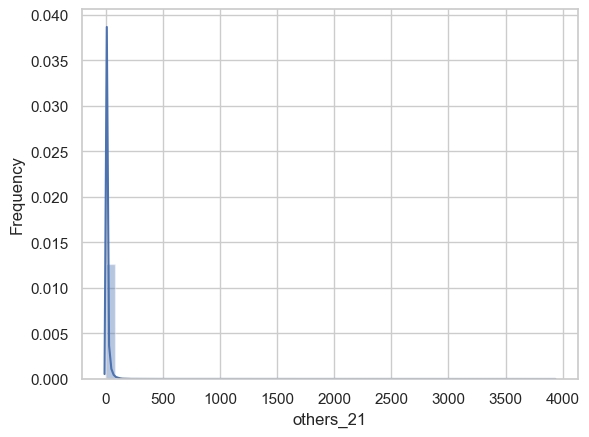

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


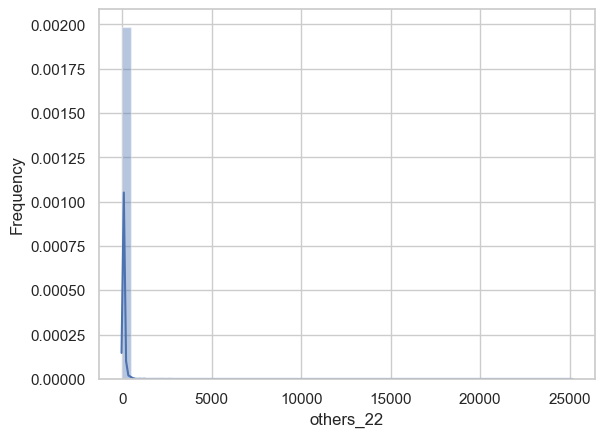

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


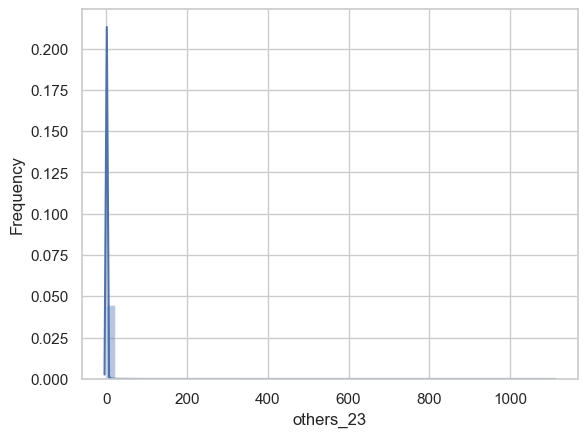

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


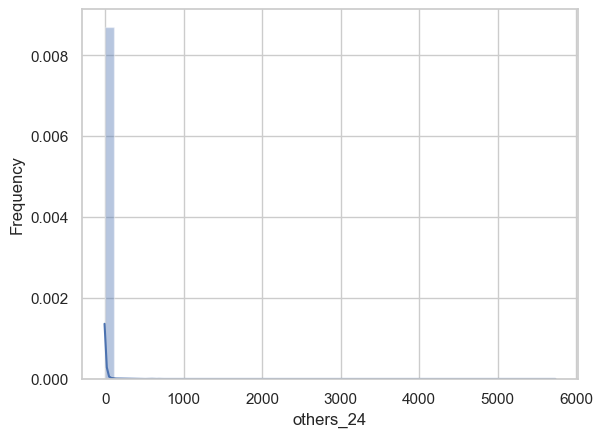

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


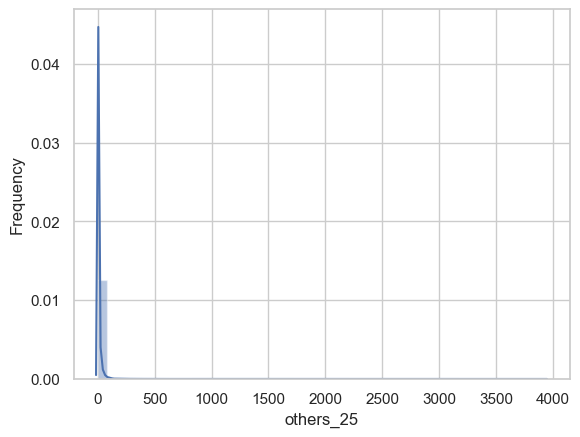

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


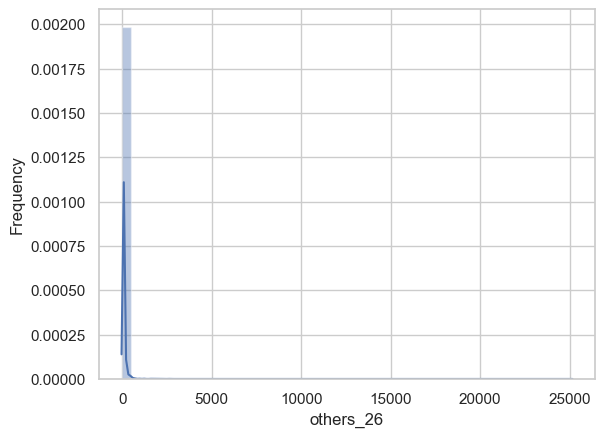

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


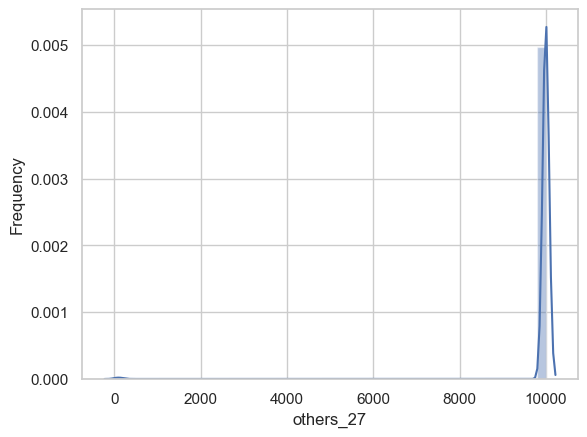

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


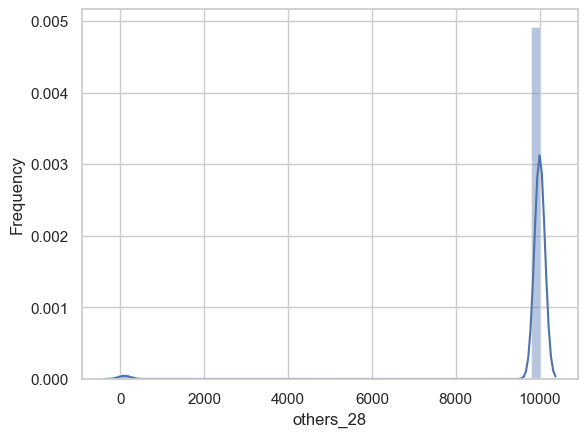

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


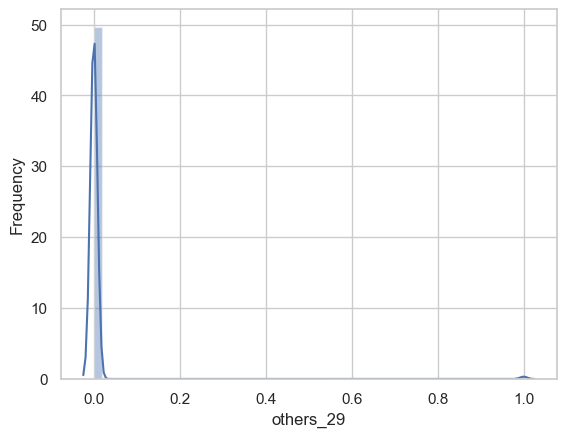

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


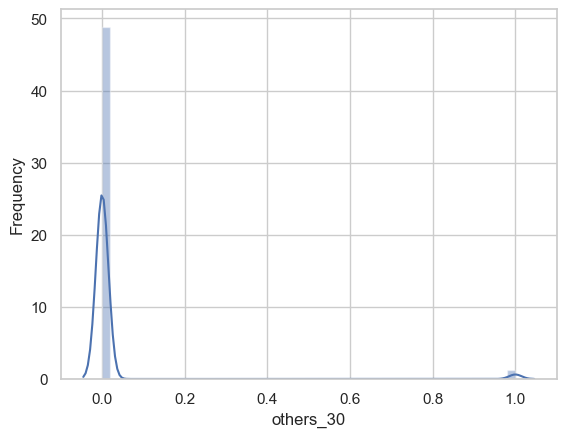

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


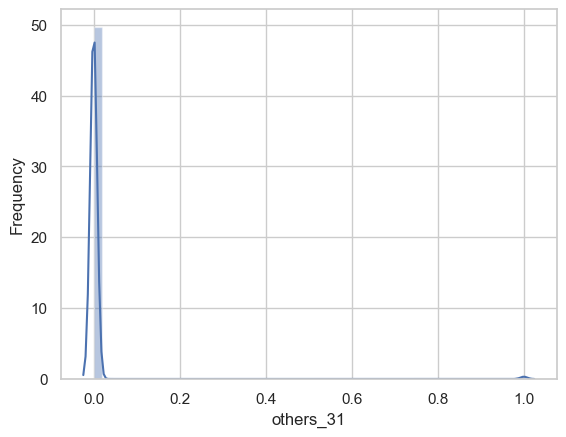

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


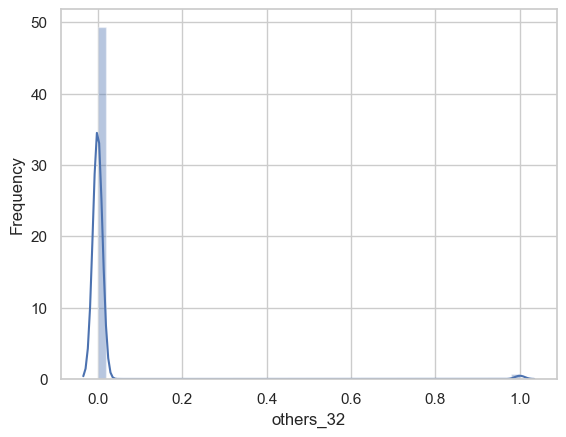

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


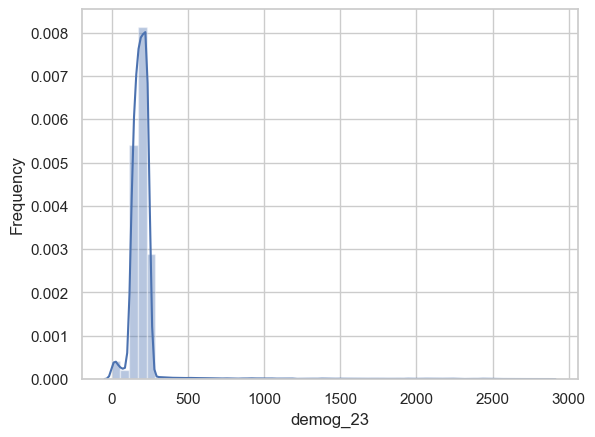

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


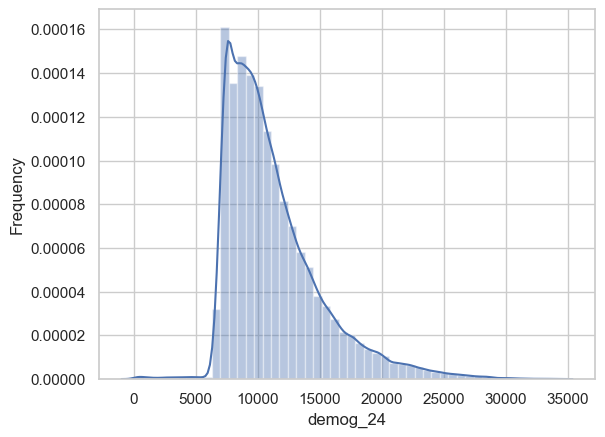

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


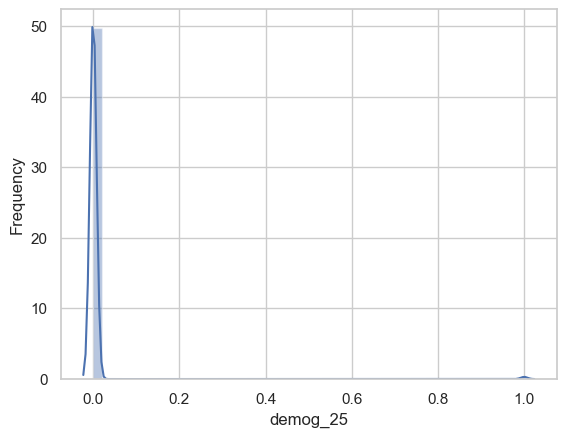

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


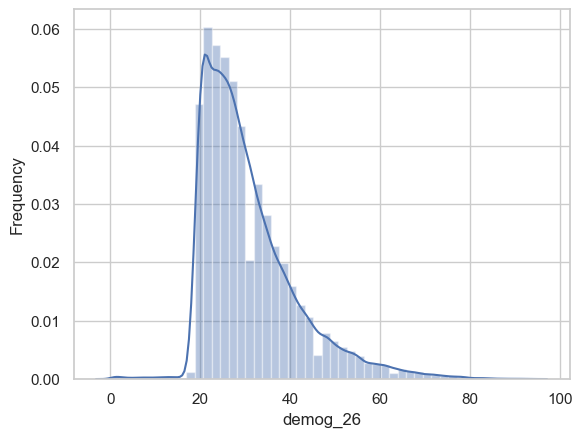

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


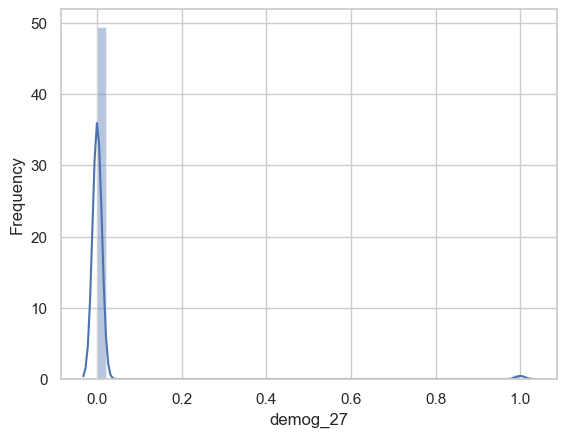

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


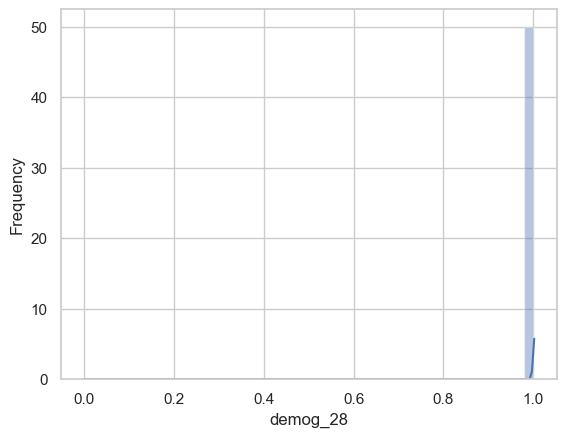

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


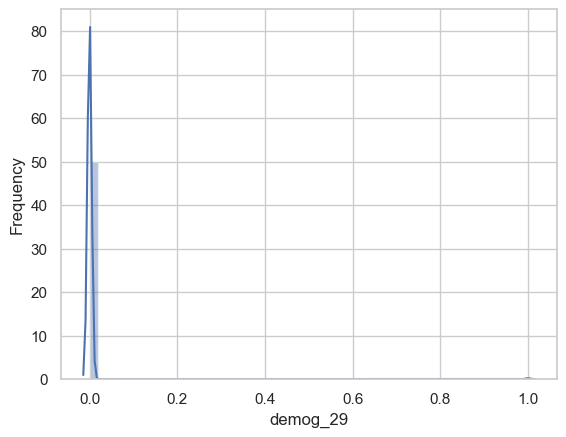

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


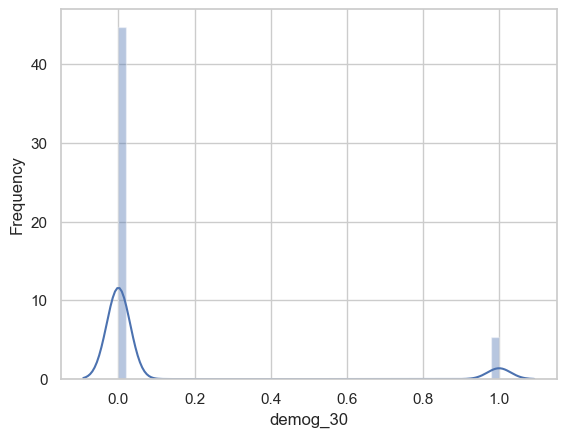

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


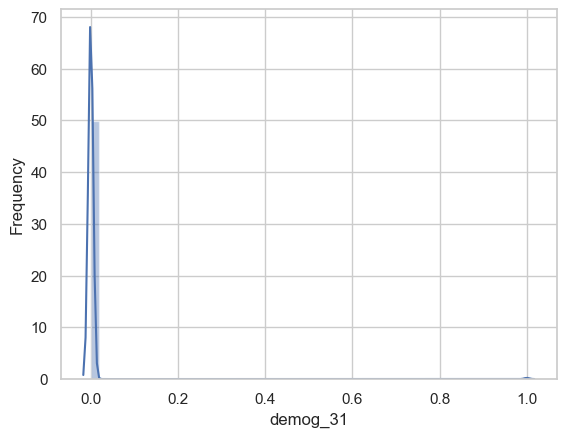

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


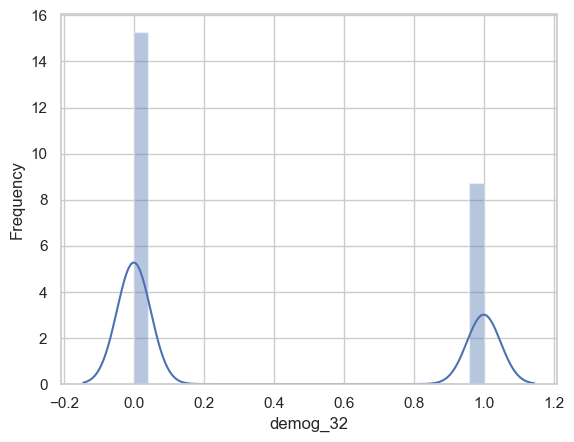

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


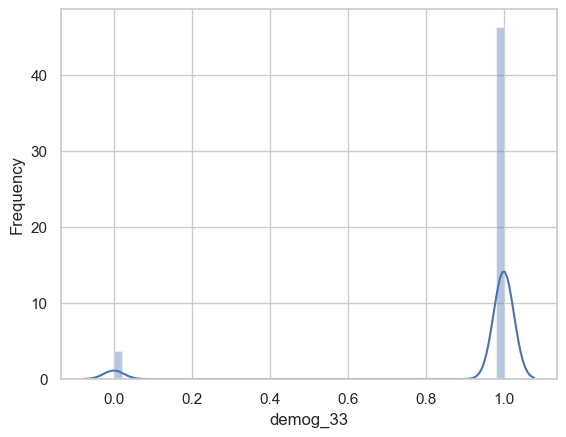

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


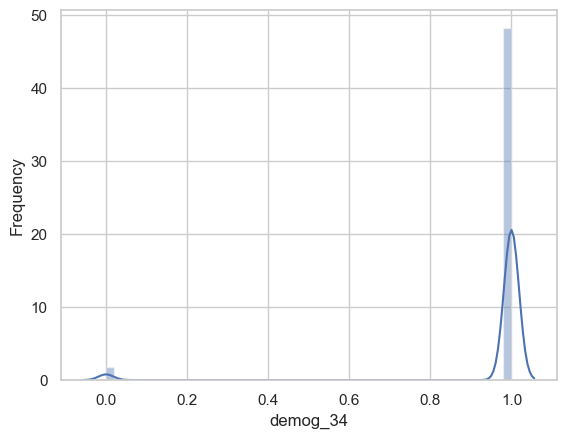

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


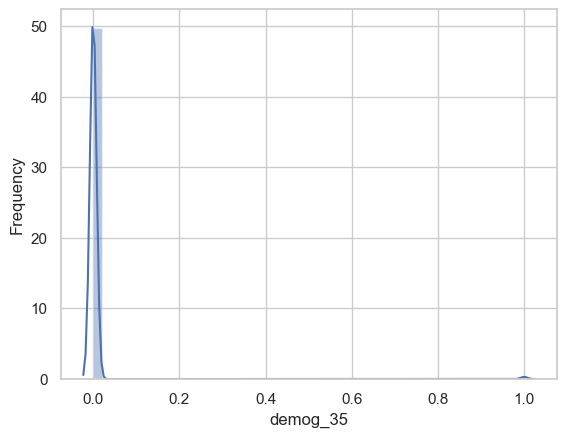

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


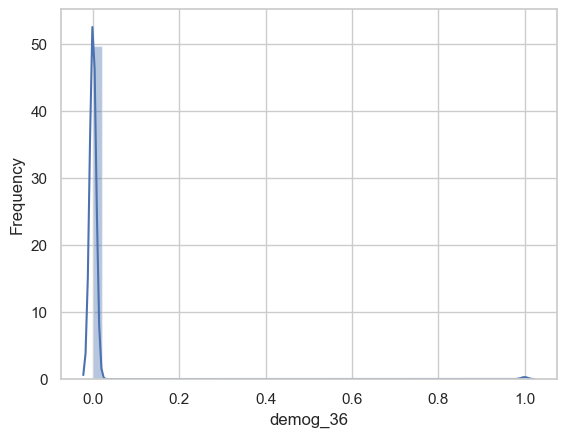

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


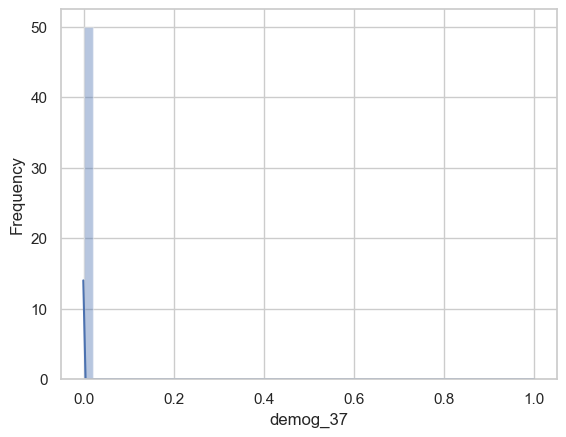

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])
C:\Users\PRATHAM\anaconda3\lib\site-packages\seaborn\distributions.py:2511: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


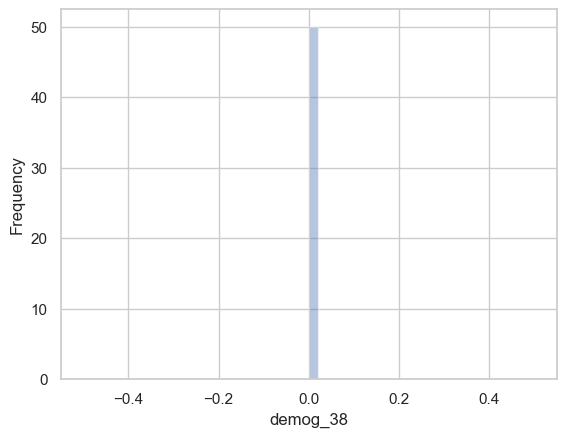

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


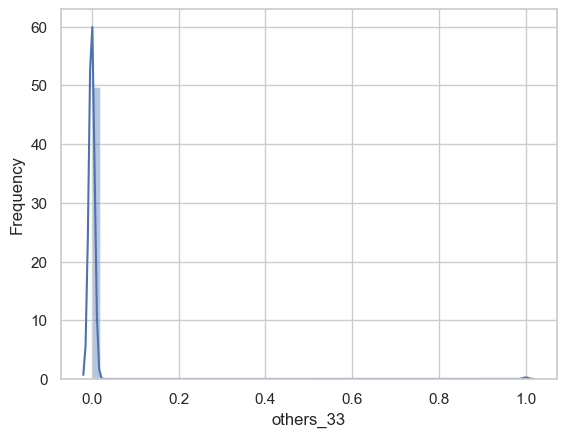

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


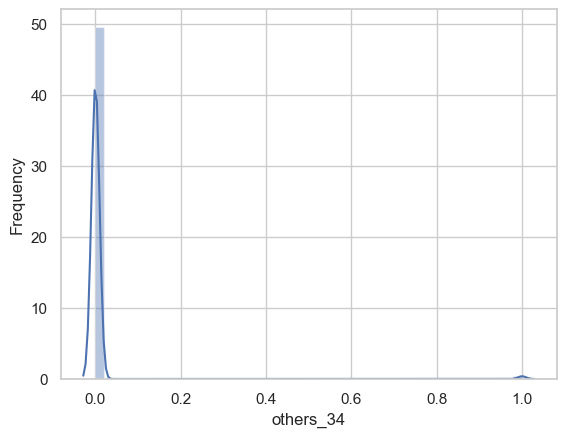

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


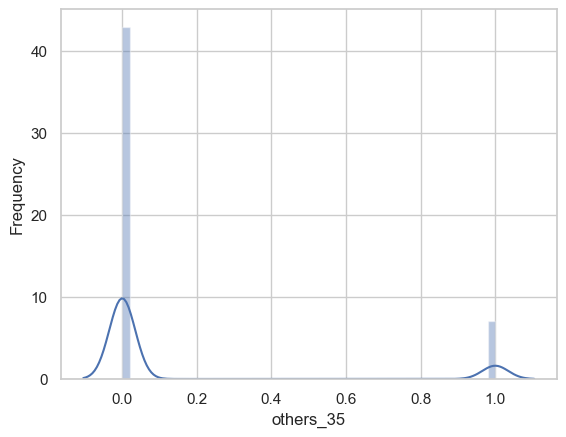

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


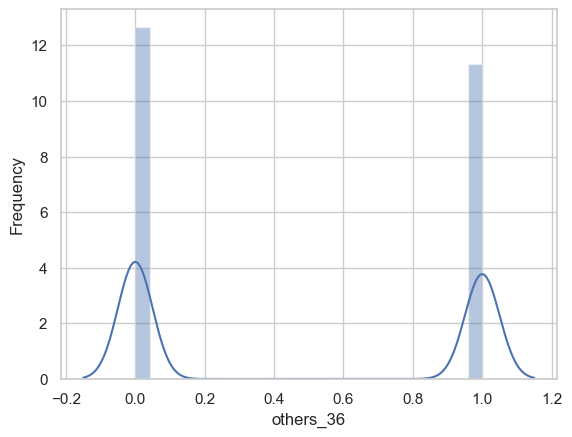

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


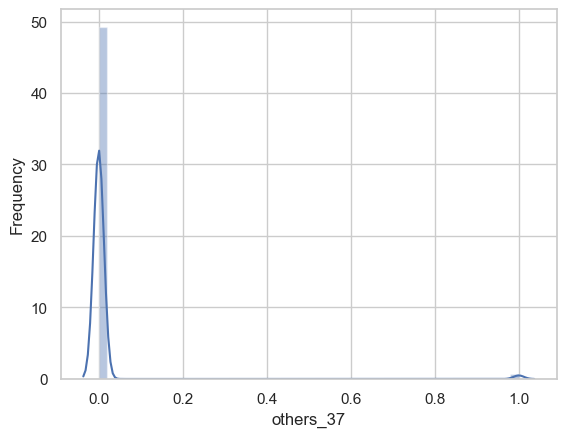

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


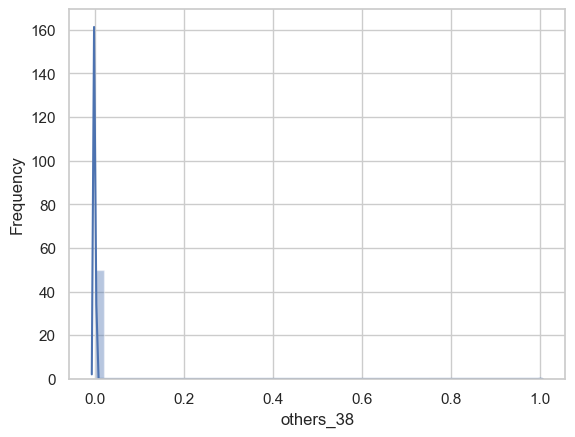

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


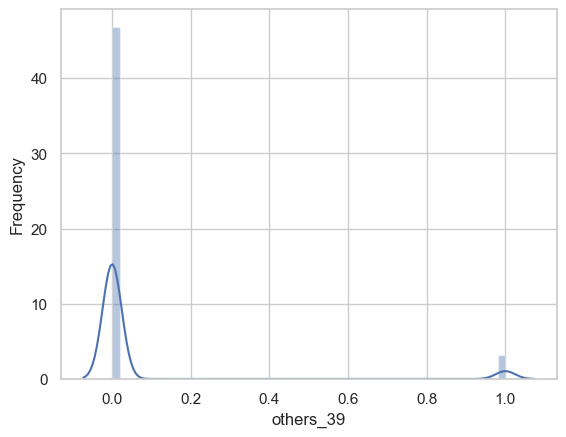

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


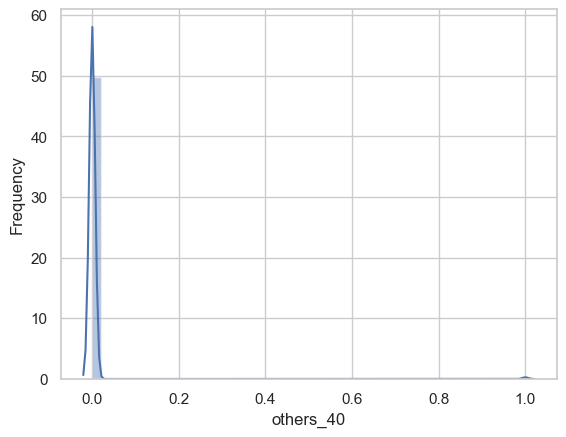

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


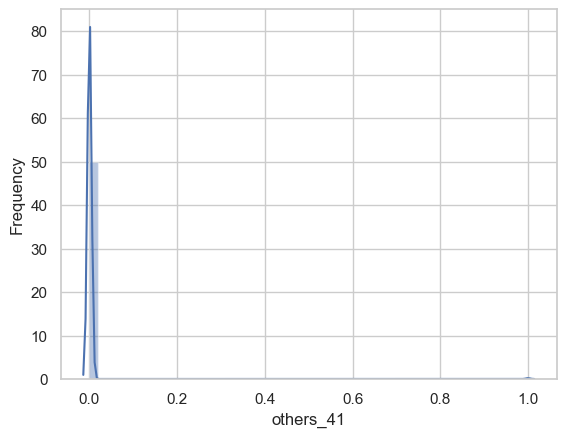

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


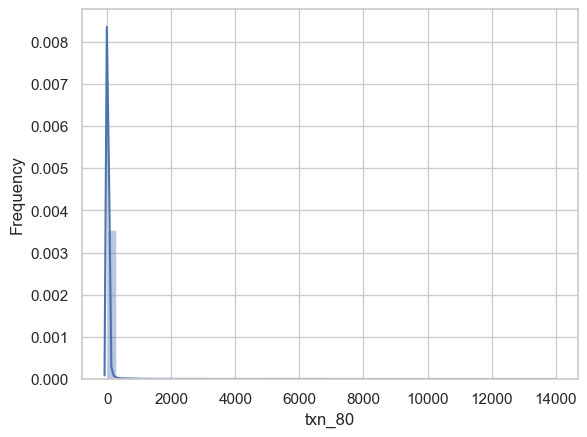

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


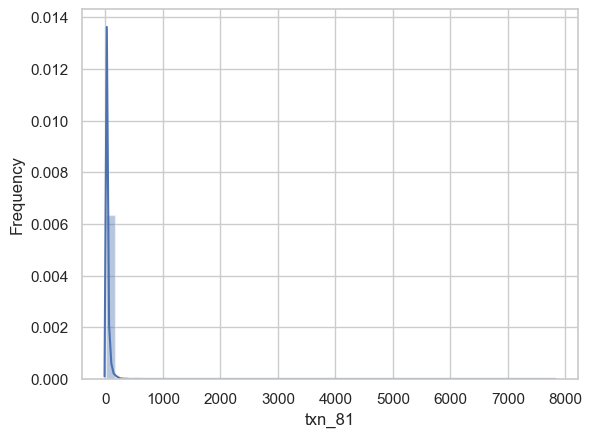

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


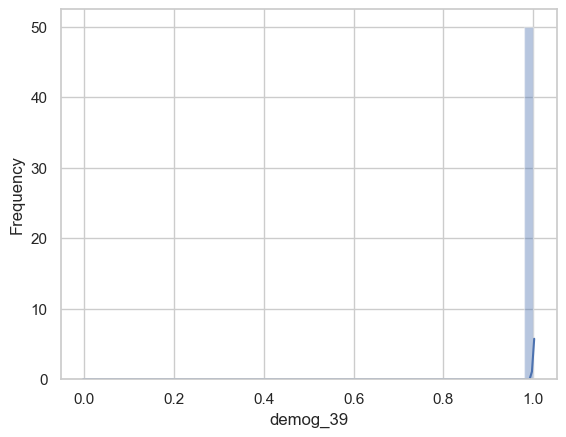

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


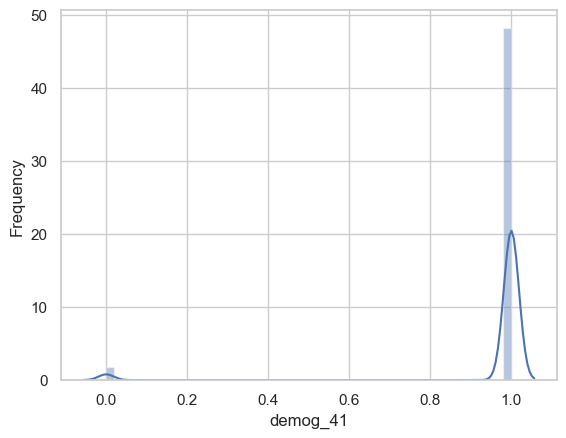

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


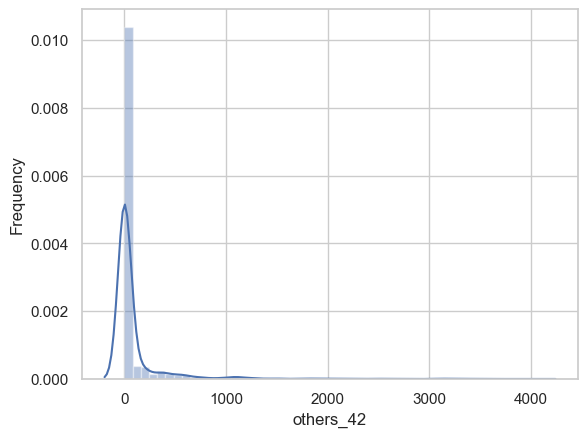

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


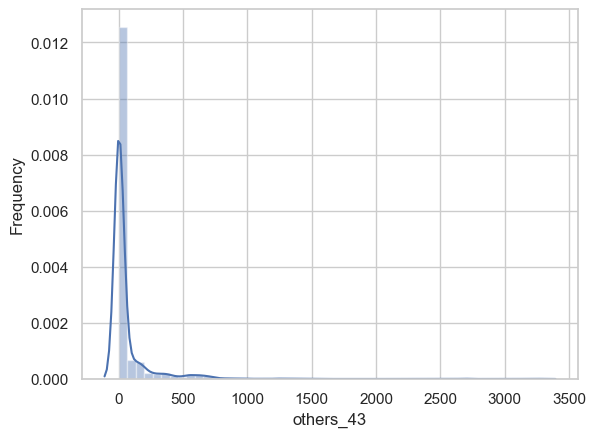

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


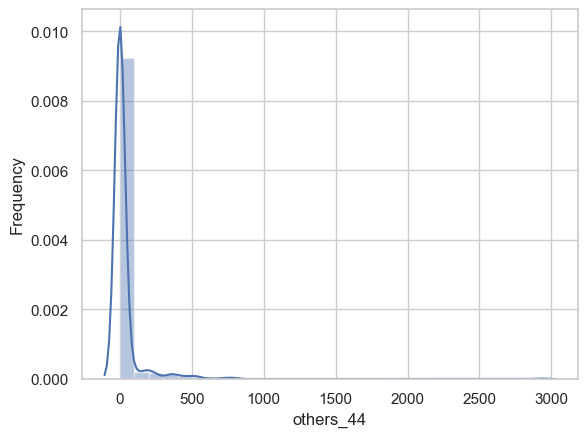

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


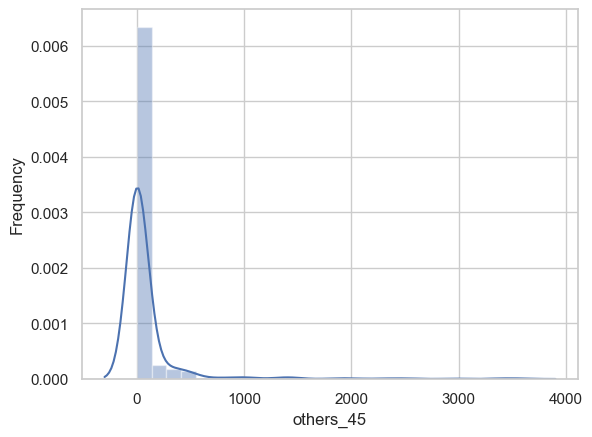

C:\Users\PRATHAM\AppData\Local\Temp\ipykernel_23896\3533731365.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])


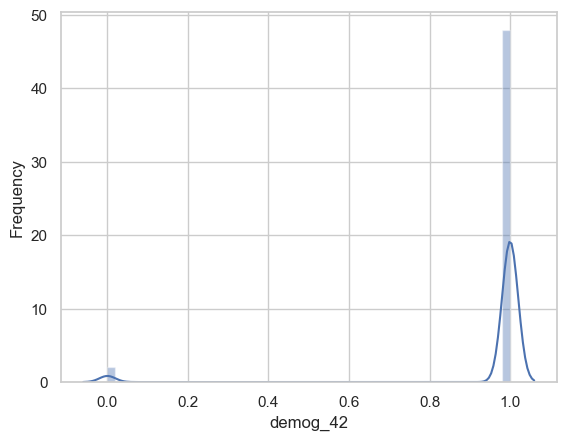

In [17]:
for column in numeric_columns:
    plt.xlabel(column)
    plt.ylabel('Frequency')
    sns.distplot(x=df[column])
    plt.show()

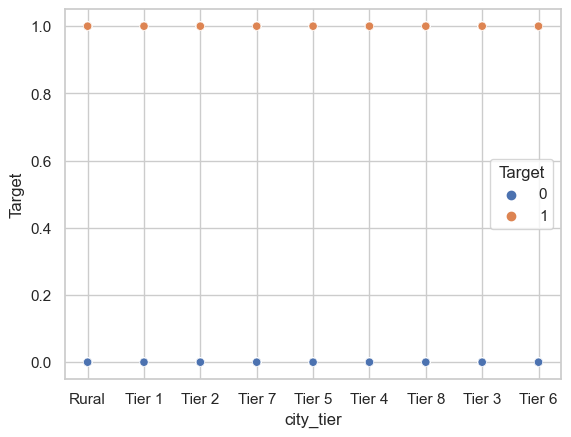

In [18]:
sns.scatterplot(x=df['city_tier'],y=df['Target'],hue=df['Target'])
plt.show()

### Data Preprocessing

In [19]:
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler

class DataFramePreprocessor:
    def __init__(self, dataframe):
        self.df = dataframe
        self.null_columns = self.df.columns[self.df.isnull().any()]


        self.columns_to_drop = ['demog_7','demog_10','demog_12','txn_49','txn_50','txn_65','txn_70','txn_71','txn_72','demog_38','others_42','others_43','others_44','others_45',
                                'account_opening_date']

    def drop_columns(self, data):
        self.df = data.drop(columns = self.columns_to_drop,axis=1)

        return self.df

    def label_encoding(self):
        replacements_1 = {-2: 0, -1: 0}
        replacements_2 = {'Y': 1, 'N': 0}
        replacements_3 = {'low':0, 'medium':1,'High':2}
        replacements_4 = {'100001 to 5L':2, '0 to 1L':1, '5L to 10L':3, '10L to 25L':4, '0':0,
       '25L to 50L':5, '50L to 3Crore':6, '3Crore to 5Crore':7,
       '10Crore to 15Crore':9, '5Crore to 10Crore':8, '20Crore to 35Crore':11,
       '15Crore to 20Crore':10 }
        replacements_5 = {}
        self.df['demog_2'] = self.df['demog_2'].replace('ZZ', 0)
        self.df['demog_4'] = self.df['demog_4'].replace('N', 0)
        self.df['others_27'] = self.df['others_27'].replace('-1', 0)
        self.df['others_28'] = self.df['others_28'].replace(replacements_1)
        self.df['demog_22'] = self.df['demog_22'].replace(replacements_2)
        self.df['demog_40'] = self.df['demog_40'].replace(replacements_3)
        self.df['demog_43'] = self.df['demog_43'].replace(replacements_3)
        self.df['income'] = self.df['income'].replace(replacements_4)
        mapping_dict = {'IN': 1}
        # Map the country codes to 1 if 'IN', else 0
        self.df['country_code'] = self.df['country_code'].apply(lambda x: 1 if x == 'IN' else 0)

        return self.df

    def handle_missing_values(self):

        self.categorical_columns = self.df.select_dtypes(exclude=['number']).columns
        self.numeric_columns = self.df.select_dtypes(include=['number']).columns
        """
        Handle missing values using imputation.

        Parameters:
        - strategy: Imputation strategy (default is 'mean').
        """
        for column in self.categorical_columns:
            self.df[column].fillna(self.df[column].mode()[0], inplace=True)

        # Fill missing values in numerical columns with median
        for column in self.numeric_columns:
            self.df[column].fillna(self.df[column].median(), inplace=True)
        return self.df
    
    def knn_imputer(self):
        
        imputer = KNNImputer(n_neighbors=5)
        columns_with_missing_values = self.df.columns[self.df.isnull().any()].tolist()

        for column in columns_with_missing_values:
            self.df[[column]] = imputer.fit_transform(self.df[[column]])
        return self.df
        

    def one_hot_encode_categorical(self):
        """
        Perform one-hot encoding for categorical variables.
        """
        categorical_columns = self.df.select_dtypes(exclude=['number']).columns
        self.df = pd.get_dummies(self.df, columns=categorical_columns,drop_first= True)
        return self.df


    def preprocess_data(self):
        """
        Perform a series of preprocessing steps.

        Parameters:
        - impute_strategy: Imputation strategy for missing values (default is 'mean').
        - scale_numerical: Whether to scale numerical features (default is True).
        """
        self.drop_columns(self.df)
        self.label_encoding()
        self.handle_missing_values()
        final_df = self.one_hot_encode_categorical()
        #final_df = self.knn_imputer()
        return final_df



In [20]:

df_preprocessor = DataFramePreprocessor(df)
dataset = df_preprocessor.preprocess_data()
dataset.head()

,Primary key,Target,country_code,demog_1,demog_2,income,demog_3,demog_4,demog_5,demog_6,...,os_ios,email_domain_aol,email_domain_gmail,email_domain_hotmail,email_domain_icloud,email_domain_idfc,email_domain_msn,email_domain_outlook,email_domain_rediff,email_domain_yahoo
0,1,0,1,53.0,3.0,2.0,101.0,0.0,3.0,1.0,...,1,0,1,0,0,0,0,0,0,0
1,2,0,1,55.0,1.0,1.0,101.0,0.0,2.0,1.0,...,0,0,1,0,0,0,0,0,0,0
2,3,0,1,55.0,3.0,1.0,101.0,0.0,4.0,1.0,...,0,0,1,0,0,0,0,0,0,0
3,4,0,1,53.0,3.0,2.0,101.0,0.0,4.0,1.0,...,0,0,1,0,0,0,0,0,0,0
4,5,0,1,55.0,6.0,1.0,101.0,0.0,4.0,1.0,...,0,0,1,0,0,0,0,0,0,0


In [21]:
X = dataset.drop(columns=['Primary key','Target'],axis=1)
y = dataset['Target']

In [22]:
X_columns = X.columns
print(X_columns)

Index(['country_code', 'demog_1', 'demog_2', 'income', 'demog_3', 'demog_4',
       'demog_5', 'demog_6', 'demog_8', 'demog_9',
       ...
       'os_ios', 'email_domain_aol', 'email_domain_gmail',
       'email_domain_hotmail', 'email_domain_icloud', 'email_domain_idfc',
       'email_domain_msn', 'email_domain_outlook', 'email_domain_rediff',
       'email_domain_yahoo'],
      dtype='object', length=182)


In [23]:
numeric_columns = []
categorical_columns = []
for column in X_columns:
  if len(X[column].unique()) <=10:
    categorical_columns.append(column)
  else:
    numeric_columns.append(column)
print(numeric_columns)
print(categorical_columns)

['demog_1', 'demog_2', 'income', 'txn_1', 'txn_2', 'txn_3', 'txn_4', 'txn_5', 'txn_6', 'txn_7', 'txn_8', 'txn_9', 'txn_10', 'txn_11', 'txn_12', 'txn_13', 'txn_14', 'txn_15', 'txn_16', 'txn_17', 'txn_18', 'txn_19', 'txn_20', 'txn_21', 'txn_22', 'txn_23', 'txn_24', 'txn_25', 'txn_26', 'txn_27', 'txn_28', 'txn_29', 'txn_30', 'txn_31', 'txn_32', 'txn_33', 'txn_34', 'txn_39', 'txn_40', 'txn_41', 'txn_42', 'txn_43', 'txn_44', 'txn_45', 'txn_46', 'txn_47', 'txn_48', 'txn_51', 'txn_52', 'txn_53', 'txn_54', 'txn_56', 'txn_57', 'txn_58', 'txn_59', 'txn_60', 'txn_63', 'txn_64', 'txn_67', 'txn_68', 'txn_69', 'txn_73', 'txn_74', 'txn_75', 'txn_76', 'txn_77', 'txn_78', 'txn_79', 'others_6', 'others_7', 'others_8', 'others_9', 'others_10', 'others_11', 'others_12', 'others_13', 'others_15', 'others_16', 'others_21', 'others_22', 'others_23', 'others_24', 'others_25', 'others_26', 'others_27', 'others_28', 'demog_23', 'demog_24', 'demog_26', 'txn_80', 'txn_81']
['country_code', 'demog_3', 'demog_4', '

In [24]:
numeric_subset = dataset[numeric_columns]
categorical_subset = dataset[categorical_columns]

## Feature Selection

#### 1. Ranking Categorical columns

In [25]:
from sklearn.model_selection import train_test_split
X_categorical = X[categorical_columns].values

from sklearn.feature_selection import chi2, SelectKBest
from sklearn.preprocessing import MinMaxScaler

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_categorical, dataset['Target'], stratify=dataset['Target'], shuffle = True, test_size=0.2, random_state=42)

# Performing chi-square test for feature selection
k_best = SelectKBest(chi2, k=11)
X_train_chi2 = k_best.fit_transform(X_train, y_train)
X_test_chi2 = k_best.transform(X_test)

selected_feature_indices = k_best.get_support(indices=True)

# Getting the names of the selected features and their scores
selected_categorical_features = categorical_subset.columns[selected_feature_indices]
selected_feature_scores = k_best.scores_[selected_feature_indices]

# Creating a DataFrame for selected features and their scores
feature_scores_df = pd.DataFrame({'Feature': selected_categorical_features, 'Chi2 Score': selected_feature_scores})

# Sorting the DataFrame in descending order based on Chi2 Score
feature_scores_df = feature_scores_df.sort_values(by='Chi2 Score', ascending=False)

# Displaying the sorted DataFrame
print("\nSelected Features and their Chi2 Scores (Descending Order):")
print(feature_scores_df)
print(feature_scores_df.shape)


Selected Features and their Chi2 Scores (Descending Order):
                     Feature   Chi2 Score
8                   demog_40  3091.708375
0                    demog_9   409.856658
7                  others_36   350.259639
9                   demog_43   350.127096
3                   others_1   273.631231
1                   demog_20   273.537889
2                   demog_21   182.034070
6                   others_5   143.027188
5                   others_3   127.821439
4                   others_2   122.603774
10  occupation_Self_Employed   112.158474
(11, 2)


### 2. Anova Test for Numeric Features

In [26]:
from sklearn.feature_selection import SelectKBest, f_classif
import numpy as np

X_numerical = X[numeric_columns].values
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X_numerical)
X_train, X_test, y_train, y_test = train_test_split(X_normalized, dataset['Target'], stratify=dataset['Target'], shuffle = True, test_size=0.2, random_state=42)

# Selecting the k best features using ANOVA F-test
k_best = SelectKBest(score_func=f_classif, k=61) 
X_train_selected = k_best.fit_transform(X_train, y_train)

# Getting the scores of the selected features
feature_scores = k_best.scores_

# Getting the indices of the selected features sorted by score in descending order
selected_feature_indices_sorted = np.argsort(feature_scores)[::-1][:61]

# Getting the names and scores of the selected features
selected_feature_names_sorted = numeric_subset.columns[selected_feature_indices_sorted]
selected_feature_scores_sorted = feature_scores[selected_feature_indices_sorted]

# Displaying the selected feature names and scores
print("Selected Features and their Scores (Descending Order):")
numeric_features = []
for feature_name, score in zip(selected_feature_names_sorted, selected_feature_scores_sorted):
    print(f"Feature: {feature_name}, Score: {score}")
    numeric_features.append(feature_name)
print(numeric_features)
print(len(numeric_features))

Selected Features and their Scores (Descending Order):
Feature: others_13, Score: 15357.5263469361
Feature: others_16, Score: 15082.501029843965
Feature: others_7, Score: 14032.306870367014
Feature: txn_80, Score: 10381.591594964906
Feature: others_25, Score: 9892.12471302674
Feature: txn_75, Score: 9824.789024366843
Feature: others_10, Score: 9407.26077824684
Feature: txn_11, Score: 9212.507858840301
Feature: txn_76, Score: 8927.073096188287
Feature: others_15, Score: 8665.655746868535
Feature: txn_12, Score: 8558.348892845252
Feature: others_21, Score: 6041.954472056138
Feature: others_23, Score: 5754.665076593081
Feature: others_12, Score: 4990.442406900264
Feature: others_26, Score: 3553.8596938798587
Feature: txn_73, Score: 3525.6007875058117
Feature: txn_7, Score: 3487.5835025996334
Feature: others_6, Score: 3462.3609709110506
Feature: txn_5, Score: 3058.5434523480076
Feature: txn_25, Score: 2697.819732272067
Feature: txn_1, Score: 2403.0910591902752
Feature: others_24, Score: 21

In [45]:

from sklearn.preprocessing import StandardScaler

subset1 = dataset[numeric_features]
subset2 = dataset[selected_categorical_features]
# Normalizing subset1
scaler = StandardScaler()
normalized_subset1 = pd.DataFrame(scaler.fit_transform(subset1), columns=subset1.columns)

# Concatenating the subsets along columns
concatenated_df = pd.concat([normalized_subset1, subset2], axis=1)

# Display the concatenated DataFrame
concatenated_df.head()

,others_13,others_16,others_7,txn_80,others_25,txn_75,others_10,txn_11,txn_76,others_15,...,demog_20,demog_21,others_1,others_2,others_3,others_5,others_36,demog_40,demog_43,occupation_Self_Employed
0,-0.344639,-0.415547,-0.918514,-0.100964,0.006368,-0.022093,-0.675621,-0.015684,-0.067763,-0.349141,...,1.0,0.0,1,1,0.0,1.0,0,0.0,1.0,1
1,-0.019546,-0.042269,0.080406,-0.034249,-0.185019,-0.035125,0.215123,-0.029018,-0.017165,-0.060049,...,1.0,1.0,1,0,0.0,1.0,1,2.0,2.0,0
2,1.013104,1.143435,1.117746,-0.076704,-0.089326,-0.028609,1.140127,-0.055686,-0.045275,0.858245,...,0.0,0.0,0,1,0.0,1.0,1,1.0,2.0,1
3,-1.128687,0.067518,-1.033774,-0.100964,-0.089326,-0.067707,-0.778399,-0.055686,-0.118360,0.024979,...,0.0,0.0,0,0,0.0,1.0,0,2.0,2.0,1
4,0.267301,0.287093,0.368556,-0.076704,-0.161096,-0.067707,0.472069,-0.062353,-0.112738,0.195033,...,0.0,0.0,0,0,0.0,1.0,0,0.0,1.0,0


### XGBoost Model (without hyperparameter tuning)

In [82]:
import xgboost as xgb
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
X_train, X_test, y_train, y_test = train_test_split(concatenated_df, dataset['Target'], stratify=dataset['Target'], shuffle = True, test_size=0.2, random_state=42)

### Oversampling using SMOTE

In [83]:
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [86]:
xg = xgb.XGBClassifier()
xg.fit(X_train_resampled,y_train_resampled)
y_pred = xg.predict(X_test)
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print("roc_auc_score:",roc_auc_score(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     19600
           1       0.92      0.91      0.92       400

    accuracy                           1.00     20000
   macro avg       0.96      0.96      0.96     20000
weighted avg       1.00      1.00      1.00     20000

[[19569    31]
 [   35   365]]
roc_auc_score: 0.9554591836734694


### Random Forest

In [85]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()

# Train the classifier on the resampled training data
rf.fit(X_train_resampled, y_train_resampled)

# Make predictions on the test data
y_pred_rf = rf.predict(X_test)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_rf))

# Print the confusion matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_rf))

print("roc_auc_score:",roc_auc_score(y_test, y_pred_rf))

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     19600
           1       0.89      0.92      0.91       400

    accuracy                           1.00     20000
   macro avg       0.95      0.96      0.95     20000
weighted avg       1.00      1.00      1.00     20000

Confusion Matrix:
[[19556    44]
 [   32   368]]
roc_auc_score: 0.9588775510204081


### Hyperparameter Tuning using GridSearch

In [31]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [700],  # Number of trees
    'max_depth': [11],  # Maximum depth of a tree
    'learning_rate': [0.05],  # Learning rate
    'subsample': [0.45],  # Subsample ratio of the training instances
    'colsample_bytree': [0.45],  # Subsample ratio of columns when constructing each tree
    'gamma':[0.1,0.2,0.3],
    'min_child_weight':[0.5,1,1.5],
    'reg_alpha':[0.1,0.2,0.3],
    'scale_pos_weight':[1,49]
}

xgb = xgb.XGBClassifier()

# Performing grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, cv=3, scoring='f1', verbose=1, n_jobs=-1)
grid_search.fit(X_train_resampled, y_train_resampled)

# Getting the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Evaluating the model with the best hyperparameters on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

# Generating classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

Fitting 3 folds for each of 54 candidates, totalling 162 fits
Best Hyperparameters: {'colsample_bytree': 0.45, 'gamma': 0.2, 'learning_rate': 0.05, 'max_depth': 11, 'min_child_weight': 0.5, 'n_estimators': 700, 'reg_alpha': 0.2, 'scale_pos_weight': 1, 'subsample': 0.45}
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     19600
           1       0.92      0.92      0.92       400

    accuracy                           1.00     20000
   macro avg       0.96      0.96      0.96     20000
weighted avg       1.00      1.00      1.00     20000

[[19566    34]
 [   34   366]]


### XGBoost Model (using optimal hyperparamters)

In [87]:
import xgboost
xg = xgboost.XGBClassifier(n_estimators= 700,  # Number of trees
    max_depth=11,  # Maximum depth of a tree
    learning_rate= 0.05,  # Learning rate
    subsample= 0.45,  # Subsample ratio of the training instances
    colsample_bytree=0.45,
     gamma=0.1,
   min_child_weight=0.5,
   reg_alpha=0.1,
   reg_lambda=1,
   scale_pos_weight=1)                 
xg.fit(X_train_resampled,y_train_resampled)
# Predicting probabilities for each class
y_probabilities = xg.predict_proba(X_test)

# Setting a custom threshold
custom_threshold = 0.4

# Converting probability estimates to binary predictions based on the threshold
y_pred = (y_probabilities[:, 1] > custom_threshold).astype(int)
#y_pred = xg.predict(X_test)
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(roc_auc_score(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     19600
           1       0.91      0.92      0.91       400

    accuracy                           1.00     20000
   macro avg       0.96      0.96      0.96     20000
weighted avg       1.00      1.00      1.00     20000

[[19565    35]
 [   34   366]]
0.9566071428571429


### XGBoost Model (using optimal hyperparameters and stratified k-fold CV)

In [90]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
import xgboost as xgb

n_splits = 5 

stratified_kfold = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

y = dataset['Target']

classification_reports = []
roc_auc_scores = []
confusion_matrices = []

# Performing stratified k-fold cross-validation
for fold_idx, (train_index, test_index) in enumerate(stratified_kfold.split(concatenated_df, y)):
    X_train, X_test = concatenated_df.iloc[train_index], concatenated_df.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    # Performing SMOTE oversampling on the training data
    smote = SMOTE(random_state=42)
    X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)
    
    # Initializing XGBoost classifier
    xg = xgb.XGBClassifier(n_estimators= 700,  # Number of trees
    max_depth=11,  # Maximum depth of a tree
    learning_rate= 0.05,  # Learning rate
    subsample= 0.45,  # Subsample ratio of the training instances
    colsample_bytree=0.45,
     gamma=0.1,
   min_child_weight=0.5,
   reg_alpha=0.1,
   reg_lambda=1,
   scale_pos_weight=1) 
    
    # Training the model
    xg.fit(X_train_resampled, y_train_resampled)
    
    # Predicting probabilities
    y_pred_proba = xg.predict_proba(X_test)[:, 1]
    
    # Predicting classes
    y_pred = xg.predict(X_test)
    
    # Computing performance metrics
    classification_rep = classification_report(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    confusion_mat = confusion_matrix(y_test, y_pred)
    
    # Appending performance metrics to lists
    classification_reports.append(classification_rep)
    roc_auc_scores.append(roc_auc)
    confusion_matrices.append(confusion_mat)
    
    print(f"Fold {fold_idx + 1}:")
    print("Classification Report:")
    print(classification_rep)
    print("ROC-AUC Score:", roc_auc)
    print("Confusion Matrix:")
    print(confusion_mat)
    print("-----------------------------------")
    


Fold 1:
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     19600
           1       0.92      0.94      0.93       400

    accuracy                           1.00     20000
   macro avg       0.96      0.97      0.97     20000
weighted avg       1.00      1.00      1.00     20000

ROC-AUC Score: 0.9991113520408164
Confusion Matrix:
[[19567    33]
 [   22   378]]
-----------------------------------
Fold 2:
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     19600
           1       0.90      0.92      0.91       400

    accuracy                           1.00     20000
   macro avg       0.95      0.96      0.95     20000
weighted avg       1.00      1.00      1.00     20000

ROC-AUC Score: 0.9991368622448978
Confusion Matrix:
[[19558    42]
 [   32   368]]
-----------------------------------
Fold 3:
Classification Report:
              p

In [75]:
classification_reports = np.array(classification_reports)
roc_auc_scores = np.array(roc_auc_scores)
confusion_matrices = np.array(confusion_matrices)

# Computing average ROC-AUC score
average_roc_auc_score = np.mean(roc_auc_scores)

# Computing average confusion matrix
average_confusion_matrix = np.mean(confusion_matrices, axis=0)

print("\nAverage ROC-AUC Score:", average_roc_auc_score)
print("\nAverage Confusion Matrix:")
print(average_confusion_matrix)


Average ROC-AUC Score: 0.9992386734693879

Average Confusion Matrix:
[[19561.6    38.4]
 [   27.8   372.2]]


### Neural Network

In [34]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import BatchNormalization, Dropout
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Create a Sequential model
model = Sequential()

# Add layers to the model
model.add(Dense(units=128, activation='relu', input_dim=72))  # Input layer
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(units=256, activation='relu'))  # Hidden layer 1
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(units=512, activation='relu'))  # Hidden Layer 2
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(units=256, activation='relu'))  # Hidden layer 3
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(units=128, activation='relu'))  # Hidden layer 4
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(units=1, activation='sigmoid'))  # Output layer

In [35]:
# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Display the model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               9344      
                                                                 
 batch_normalization (Batch  (None, 128)               512       
 Normalization)                                                  
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               33024     
                                                                 
 batch_normalization_1 (Bat  (None, 256)               1024      
 chNormalization)                                                
                                                                 
 dropout_1 (Dropout)         (None, 256)               0

Epoch 1/100
123/123 [==============================] - 22s 133ms/step - loss: 0.0689 - accuracy: 0.9773 - val_loss: 0.0198 - val_accuracy: 0.9977 - lr: 0.0010
Epoch 2/100
123/123 [==============================] - 7s 57ms/step - loss: 0.0330 - accuracy: 0.9898 - val_loss: 0.0120 - val_accuracy: 0.9980 - lr: 0.0010
Epoch 3/100
123/123 [==============================] - 7s 56ms/step - loss: 0.0276 - accuracy: 0.9914 - val_loss: 0.0135 - val_accuracy: 0.9976 - lr: 0.0010
Epoch 4/100
123/123 [==============================] - 7s 56ms/step - loss: 0.0246 - accuracy: 0.9926 - val_loss: 0.0090 - val_accuracy: 0.9983 - lr: 0.0010
Epoch 5/100
123/123 [==============================] - 7s 56ms/step - loss: 0.0220 - accuracy: 0.9934 - val_loss: 0.0124 - val_accuracy: 0.9975 - lr: 0.0010
Epoch 6/100
123/123 [==============================] - 7s 57ms/step - loss: 0.0194 - accuracy: 0.9941 - val_loss: 0.0089 - val_accuracy: 0.9982 - lr: 0.0010
Epoch 7/100
123/123 [==============================] - 8

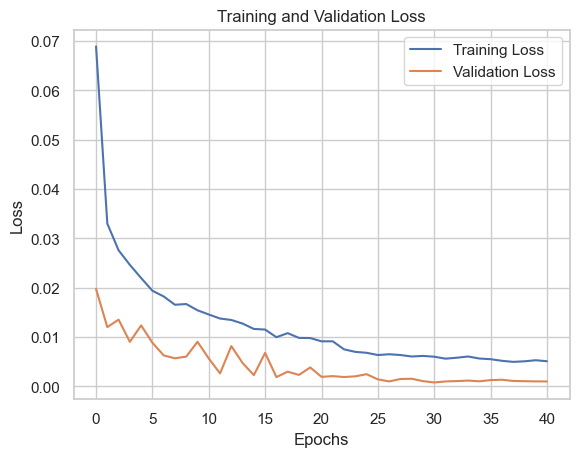

In [36]:
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6)

# Train the model
history = model.fit(X_train_resampled, y_train_resampled, epochs=100, batch_size=1024, validation_split=0.2, 
                    callbacks=[early_stopping, reduce_lr]) # class_weight={0: 1, 1: 1},

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [89]:
y_pred = model.predict(X_test)
y_pred_binary = (y_pred > 0.5).astype(int)
cm = confusion_matrix(y_test, y_pred_binary)
print(classification_report(y_test,y_pred_binary))
print("Confusion Matrix:")
print(cm)
print('roc_auc_score:',roc_auc_score(y_test,y_pred_binary))

625/625 [==============================] - 2s 3ms/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     19600
           1       0.88      0.91      0.90       400

    accuracy                           1.00     20000
   macro avg       0.94      0.96      0.95     20000
weighted avg       1.00      1.00      1.00     20000

Confusion Matrix:
[[19552    48]
 [   35   365]]
roc_auc_score: 0.9550255102040817


### Test Dataset

In [38]:
test_df = pd.read_excel('C:/Users/PRATHAM/Downloads/Convolve 2.0 Epoch 2 PS/validation_data_to_be_shared.xlsx')
test_df.head()

,Primary key,account_opening_date,country_code,demog_1,demog_2,income,demog_3,city_tier,occupation,demog_4,...,demog_39,email_domain,demog_40,demog_41,others_42,others_43,others_44,others_45,demog_42,demog_43
0,9000001,2023-03-25,IN,56.0,2,5L to 10L,101.0,Tier 7,Self_Employed,N,...,1,gmail,High,1,NaN,NaN,NaN,NaN,1,High
1,9000002,2023-01-15,IN,55.0,1,100001 to 5L,101.0,Tier 5,Salaried,N,...,1,gmail,low,1,NaN,NaN,NaN,NaN,1,medium
2,9000003,2023-01-06,IN,55.0,1,100001 to 5L,101.0,Tier 1,Other,N,...,1,gmail,low,1,NaN,NaN,NaN,NaN,1,medium
3,9000004,2023-02-08,IN,55.0,1,100001 to 5L,101.0,Tier 1,Other,N,...,1,gmail,medium,1,NaN,0.0,NaN,NaN,1,High
4,9000005,2023-01-27,IN,55.0,1,100001 to 5L,101.0,Tier 5,Other,N,...,1,gmail,low,1,NaN,NaN,NaN,NaN,1,High


In [42]:
test_df_preprocessor = DataFramePreprocessor(test_df)
validation_df = test_df_preprocessor.preprocess_data()
validation_df.head()

,Primary key,country_code,demog_1,demog_2,income,demog_3,demog_4,demog_5,demog_6,demog_8,...,os_ios,email_domain_aol,email_domain_gmail,email_domain_hotmail,email_domain_icloud,email_domain_idfc,email_domain_msn,email_domain_outlook,email_domain_rediff,email_domain_yahoo
0,9000001,1,56.0,2.0,3.0,101.0,0.0,4.0,1.0,41.0,...,0,0,1,0,0,0,0,0,0,0
1,9000002,1,55.0,1.0,2.0,101.0,0.0,2.0,1.0,41.0,...,0,0,1,0,0,0,0,0,0,0
2,9000003,1,55.0,1.0,2.0,101.0,0.0,3.0,1.0,42.0,...,0,0,1,0,0,0,0,0,0,0
3,9000004,1,55.0,1.0,2.0,101.0,0.0,4.0,1.0,41.0,...,0,0,1,0,0,0,0,0,0,0
4,9000005,1,55.0,1.0,2.0,101.0,0.0,4.0,1.0,41.0,...,0,0,1,0,0,0,0,0,0,0


In [44]:

from sklearn.preprocessing import StandardScaler

subset1 = validation_df[numeric_features]
subset2 = validation_df[selected_categorical_features]
# Normalizing subset1
scaler = StandardScaler()
normalized_subset1 = pd.DataFrame(scaler.fit_transform(subset1), columns=subset1.columns)

# Concatenating the subsets along columns
concatenated_test_df = pd.concat([normalized_subset1, subset2], axis=1)

# Display the concatenated DataFrame
concatenated_test_df.head()

,others_13,others_16,others_7,txn_80,others_25,txn_75,others_10,txn_11,txn_76,others_15,...,demog_20,demog_21,others_1,others_2,others_3,others_5,others_36,demog_40,demog_43,occupation_Self_Employed
0,-0.947732,-1.049968,-0.892937,-0.070082,-0.016795,-0.053481,-0.659379,-0.060562,-0.035938,-0.866120,...,1.0,0.0,1.0,0.0,0.0,1.0,1.0,2.0,2.0,1
1,0.286195,0.289023,0.395064,-0.075854,-0.167804,-0.065115,0.495128,-0.060562,-0.099551,0.204091,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0
2,0.447143,0.056155,0.563064,-0.023905,0.411063,-0.036029,-2.550094,-0.030637,0.032976,0.017967,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0
3,-0.142997,0.056155,-1.266271,-0.093171,0.260054,-0.053481,-0.994019,-0.060562,-0.073046,0.017967,...,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,2.0,0
4,0.071599,0.056155,0.171064,-0.075854,-0.192972,-0.065115,0.294344,-0.060562,-0.099551,0.017967,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0


In [91]:
class_probabilities = xg.predict_proba(concatenated_test_df)

# Setting a custom threshold
custom_threshold = 0.4

# Converting probability estimates to binary predictions based on the threshold
y_pred = (class_probabilities[:, 1] > custom_threshold).astype(int)

In [92]:
counts = np.bincount(y_pred)

# Extract the count of 1s and 0s
count_of_ones = counts[1]
count_of_zeros = counts[0]

# Print the counts
print("Number of 1s:", count_of_ones)
print("Number of 0s:", count_of_zeros)

Number of 1s: 2714
Number of 0s: 47286


In [93]:
class_1_probabilities = class_probabilities[:, 1]

result_df = pd.DataFrame({
    'primary key': test_df['Primary key'],
    'target values': y_pred,
    'probability': class_1_probabilities
})

# Display the concatenated DataFrame
print(result_df)

       primary key  target values  probability
0          9000001              0     0.003640
1          9000002              0     0.002691
2          9000003              0     0.000643
3          9000004              0     0.005102
4          9000005              0     0.005334
5          9000006              0     0.003369
6          9000007              0     0.008178
7          9000008              0     0.000293
8          9000009              0     0.002641
9          9000010              0     0.005760
10         9000011              0     0.001822
11         9000012              0     0.031930
12         9000013              0     0.092404
13         9000014              0     0.004029
14         9000015              1     0.968590
15         9000016              0     0.003744
16         9000017              0     0.120923
17         9000018              0     0.001896
18         9000019              0     0.001595
19         9000020              0     0.000522
20         90

In [94]:
result_df.to_csv('final_submission.csv', index=False)